### Udacity Data Science Nanodegree
### Project 1: Writing a Data Scientist Blog Post
---

# Notebook 4 of 4: London Airbnb Data
# Business Question 4: Predict average daily listing price
## by Juanita Smith

- [Introduction](#intro)
- [Data gathering](#getdata)
- [Feature Engineering](#featureeng)
- [Univariate Exploration](#univariate)
- [Bivariate Exploration](#bivariate)
- [Multivariate Exploration](#multivariate)
- [Clustering](#clustering)
- [Preprocessing](#preprocessing)
- [Modelling Step 1 - Setting a baseline with Ridge and small alpha](#baseline)
- [Modelling Step 2 - Model improvement with RidgeCV](#ridgecv)
- [Final evaluation using TEST data](#final)
- [Further evaluation using unseen Airbnb with date stamp 06/09/2023](#optional)
- [Conclusions](#conclusions)
- [References](#references)
- [Submission](#submission)

<a id='intro'></a>
<span style="color:blue; font-size:30px; line-height:40px; font-family: Calibri;">Introduction</span>

In this notebook, we will use linear regression modelling to answer the last business question:

<span style="color:blue; font-size:20px; line-height:20px; font-family: Calibri;">Business Question 4: Predict average daily listing price</span>

Knowing the impact of business rentals, host excellence and star ratings from notebooks 2 and 3, could we make an accurate average daily base price prediction ?

This notebook will use the cleaned files created by running notebook 1 and 2 in sequence.
Refer to the README file for data download instructions and metadata descriptions.

As the project is predicting a continues variable, we will make use of linear regression algorithms.
To use linear regression, below assumptions needs to be tested to build a model that will generalize well.

Linear Regression Assumptions:
- Target variable is normally distributed
- There should be a linear relationship between the target and the features
- No Multicollinearity - Independent features should have no relationship between them
- Normality of the Error Terms, meaning residuals should be normally distributed with mean as centre
- Homoscedasticity - the spread of the residuals should be consistent along the regression line.

In [1]:
# avoid memory leaks
import os
os.environ["OMP_NUM_THREADS"] = '1'

In [1]:
# automatically check PEP8 compliance
%load_ext pycodestyle_magic

In [3]:
# to do PEP8 check for all code cells
%pycodestyle_on

In [4]:
# import all packages
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# clear the garbage to free memory as we are working with huge datasets
import gc
from sklearn.linear_model import RidgeCV, Ridge
from sklearn.metrics import r2_score, mean_squared_error, \
                            PredictionErrorDisplay, median_absolute_error, \
                            mean_absolute_error
from sklearn.preprocessing import StandardScaler

import scipy as sp
from patsy import dmatrices
from scipy import stats

from scipy.special import boxcox, inv_boxcox

from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.feature_selection import VarianceThreshold
from sklearn.compose import TransformedTargetRegressor, ColumnTransformer

import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

from sklearn.model_selection import cross_validate, \
                                    RepeatedStratifiedKFold, \
                                    KFold, \
                                    train_test_split

from sklearn.pipeline import Pipeline

from statsmodels.stats.diagnostic import normal_ad

from sklearn.mixture import GaussianMixture

from sklearn.feature_selection import mutual_info_regression

from pickle import dump, load

# Import custom modules
import project1_data_science_blog.src.visuals as vs

from project1_data_science_blog.src.utils import log_transform, \
                                                 inverse_log_transform, \
                                                 get_mi_score, \
                                                 calculate_residuals, \
                                                 cleaning

# suppress matplotlib user warnings
import warnings

# Make your Jupyter Notebook wider
from IPython.display import display, HTML

# geospatial analysis
import geopandas as gpd
from shapely.geometry import Point
from pyproj import CRS

In [5]:
# environment settings

# set plots to be embedded inline
%matplotlib inline

warnings.filterwarnings("ignore", category=UserWarning, module="matplotlib")
warnings.filterwarnings("ignore", category=UserWarning, module="sklearn")

# Make your Jupyter Notebook wider
display(HTML('<style>.container { width:80% !important; }</style>'))


# display all columns and rows during visual inspection
pd.options.display.max_columns = 999
pd.options.display.max_rows = 999

# # use high resolution if this project is run on an apple device
# %config InlineBackend.figure_format='retina'

gpd.options.display_precision = 15

In [6]:
# set default plot formatting and colors
BASE_COLOR, BASE_HIGHLIGHT_INTENSE, BASE_HIGHLIGHT, BASE_COMPLIMENTARY, \
    BASE_GREY, BASE_COLOR_SUB1, BASE_COLOR_SUB2, \
    SYMBOLS = vs.set_plot_defaults()

In [7]:
# default file paths

# time stamp model was developed with
date_stamp = '060623'

# latest time stamp we can use to validate our model
# as an optional last step towards the end.
date_stamp_latest = '060923'

FILE_PATH_RAW = '../data/raw/'
FILE_PATH_CLEAN = '../data/clean/'

FILE_NAME_ENHANCED = FILE_PATH_CLEAN + \
                     'listing_enhanced_' + \
                     date_stamp + \
                     '.pkl'

FILE_NAME_ENHANCED_LATEST = FILE_PATH_CLEAN + \
                            'listing_enhanced_' + \
                            date_stamp_latest + \
                            '.pkl'


FILE_NAME_NEIGHBOURHOOD = FILE_PATH_RAW + \
                            'neighbourhood_geojson/london/neighbourhoods_' + \
                            date_stamp + \
                            '.geojson'

# fitted models
file_cluster_preprocessor = '../data/models/cluster_preprocessor.pkl'
file_gmm = '../data/models/gmm.pkl'
file_onehot_preprocessor = '../data/models/onehot_preprocessor.pkl'

In [8]:
random_state = 77

<a id='getdata'></a>
<span style="color:blue; font-size:30px; line-height:40px; font-family: Calibri;">Gather Data</span>

In [9]:
# features to be used in modelling
main_cols = [
    'host_is_superhost', 'accommodates', 'bedrooms', 'bathrooms',
    'minimum_minimum_nights', 'calculated_host_listings_count',
    'host_years_active', 'price_mean',
    'private_bathroom', 'host_same_location', 'is_business',
    'availability_90', 'neighbourhood_cleansed',
    'property_type', 'room_type', 'review_scores_location',
    'review_scores_value', 'latitude', 'longitude']

In [10]:
# load the enhanced listing file
listing = pd.read_pickle(FILE_NAME_ENHANCED)
listing.head(3)

,listing_id,listing_url,name,host_id,host_name,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_neighbourhood,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bedrooms,beds,price,minimum_minimum_nights,minimum_maximum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,host_has_about,host_has_neighborhood_overview,host_years_active,price_mean,private_bathroom,host_same_location,is_business,minimum_night_ranges
0,157714,https://www.airbnb.com/rooms/157714,Townhouse in Hammersmith · ★4.71 · 1 bedroom ·...,757377,Eilinn,within a few hours,90,68,False,Hammersmith,True,True,Hammersmith and Fulham,51.48974,-0.22208,Private room in townhouse,Private room,3,1.5,1.0,1.0,69,4,21,10,37,67,67,175,10,0,2011-07-13,2023-05-02,4.71,4.66,4.78,4.84,4.83,4.76,4.66,False,1,0,1,0,1.21,True,True,12,70,True,True,False,7
1,13913,https://www.airbnb.com/rooms/13913,Rental unit in Islington · ★4.80 · 1 bedroom ·...,54730,Alina,within an hour,100,78,False,LB of Islington,True,True,Islington,51.56861,-0.11270,Private room in rental unit,Private room,1,1.0,1.0,1.0,79,1,29,23,48,78,353,41,15,0,2010-08-18,2022-12-11,4.80,4.72,4.72,4.74,4.82,4.69,4.69,False,2,1,1,0,0.26,True,True,14,79,False,True,False,7
2,15400,https://www.airbnb.com/rooms/15400,Rental unit in London · ★4.80 · 1 bedroom · 1 ...,60302,Philippa,within a day,100,47,False,Chelsea,True,True,Kensington and Chelsea,51.48780,-0.16813,Entire rental unit,Entire home/apt,2,1.0,1.0,1.0,100,7,30,0,2,2,70,94,5,0,2009-12-21,2023-05-01,4.80,4.85,4.88,4.88,4.83,4.93,4.74,False,1,1,0,0,0.57,True,True,14,107,True,True,False,7


In [11]:
# get neighborhood geoshapes for spatial analysis
crs_4326 = CRS("WGS84")
neighbourhood = gpd.read_file(FILE_NAME_NEIGHBOURHOOD, crs=crs_4326)
neighbourhood.head()

,neighbourhood,neighbourhood_group,geometry
0,Kingston upon Thames,None,MULTIPOLYGON (((-0.330679000000000 51.32901100...
1,Croydon,None,MULTIPOLYGON (((-0.064021000000000 51.31863800...
2,Bromley,None,MULTIPOLYGON (((0.012131000000000 51.299599000...
3,Hounslow,None,MULTIPOLYGON (((-0.244562000000000 51.48870200...
4,Ealing,None,MULTIPOLYGON (((-0.411833000000000 51.53408400...


In [12]:
neighbourhood.shape

(33, 3)

<a id='featureeng'></a>
<span style="color:blue; font-size:30px; line-height:40px; font-family: Calibri;">Feature engineering</span>

In [13]:
listing_clean = listing.copy()

In [14]:
# make sure that each record is a unique listing
listing_clean['listing_id'].duplicated().sum()

0

In [15]:
# for easy trouble shooting, lets make listing_id the index
listing_clean = listing_clean.set_index('listing_id')
listing_clean = listing_clean.loc[:, main_cols]
listing_clean.head()

,host_is_superhost,accommodates,bedrooms,bathrooms,minimum_minimum_nights,calculated_host_listings_count,host_years_active,price_mean,private_bathroom,host_same_location,is_business,availability_90,neighbourhood_cleansed,property_type,room_type,review_scores_location,review_scores_value,latitude,longitude
listing_id,,,,,,,,,,,,,,,,,,,
157714,False,3,1.0,1.5,4,1,12,70,True,True,False,67,Hammersmith and Fulham,Private room in townhouse,Private room,4.76,4.66,51.48974,-0.22208
13913,False,1,1.0,1.0,1,2,14,79,False,True,False,78,Islington,Private room in rental unit,Private room,4.69,4.69,51.56861,-0.11270
15400,False,2,1.0,1.0,7,1,14,107,True,True,False,2,Kensington and Chelsea,Entire rental unit,Entire home/apt,4.93,4.74,51.48780,-0.16813
306333,False,5,2.0,1.0,2,1,11,198,True,False,False,4,Hackney,Entire rental unit,Entire home/apt,4.89,4.53,51.52748,-0.08172
159736,False,2,1.0,1.0,4,4,12,62,False,False,False,2,Lambeth,Private room in rental unit,Private room,4.34,4.66,51.46788,-0.09993


In [16]:
# make sure features that will be one hot encoded
# have no spaces in it's values, as it will become part of heading
categorical_columns = ['neighbourhood_cleansed', 'property_type', 'room_type']
listing_clean[categorical_columns] = listing_clean[categorical_columns].apply(
    lambda x: x.str.replace(' ', '_').str.lower())
listing_clean[categorical_columns] = listing_clean[categorical_columns].apply(
    lambda x: x.str.replace('/', '_').str.lower())

neighbourhood['neighbourhood'] = neighbourhood['neighbourhood'].apply(
    lambda x: x.replace(' ', '_').lower())
neighbourhood['neighbourhood'] = neighbourhood['neighbourhood'].apply(
    lambda x: x.replace('/', '_').lower())

In [17]:
# check for outliers
listing_clean.describe([0.025, 0.25, 0.5, 0.75, 0.9, 0.95, 0.975, 0.99, 0.999])

,accommodates,bedrooms,bathrooms,minimum_minimum_nights,calculated_host_listings_count,host_years_active,price_mean,availability_90,review_scores_location,review_scores_value,latitude,longitude
count,68923.000000,68867.000000,68842.000000,68923.000000,68923.000000,68923.000000,68923.000000,68923.000000,47720.000000,47719.000000,68923.000000,68923.000000
mean,3.168014,1.475975,1.338630,4.350202,19.274059,6.251208,202.492608,33.066770,4.709157,4.553347,51.509690,-0.129571
std,1.985088,0.962448,0.676587,9.065348,62.684541,3.230126,240.753573,31.683168,0.441736,0.564701,0.048800,0.101330
min,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,7.000000,0.000000,0.000000,0.000000,51.295937,-0.497800
2.5%,1.000000,0.000000,1.000000,1.000000,1.000000,0.000000,30.000000,0.000000,3.670000,3.000000,51.398398,-0.344240
25%,2.000000,1.000000,1.000000,1.000000,1.000000,4.000000,70.000000,0.000000,4.620000,4.430000,51.484790,-0.190558
50%,2.000000,1.000000,1.000000,2.000000,2.000000,7.000000,129.000000,26.000000,4.830000,4.700000,51.513730,-0.129850
75%,4.000000,2.000000,1.500000,4.000000,7.000000,9.000000,232.000000,61.000000,5.000000,4.900000,51.538970,-0.069360
90%,6.000000,3.000000,2.000000,7.000000,40.000000,10.000000,409.000000,83.000000,5.000000,5.000000,51.566208,-0.011270
95%,7.000000,3.000000,2.500000,14.000000,96.000000,11.000000,619.000000,89.000000,5.000000,5.000000,51.588314,0.032107


In [18]:
# remove final outliers
listing_clean = listing_clean[listing_clean['accommodates'] <= 8]
listing_clean = listing_clean[listing_clean['bedrooms'] <= 5]
listing_clean = listing_clean[listing_clean['bathrooms'] <= 4]
listing_clean = listing_clean[listing_clean['price_mean'].between(30, 1500)]
listing_clean.describe([0.025, 0.25, 0.5, 0.75, 0.9, 0.95, 0.975, 0.99, 0.999])

,accommodates,bedrooms,bathrooms,minimum_minimum_nights,calculated_host_listings_count,host_years_active,price_mean,availability_90,review_scores_location,review_scores_value,latitude,longitude
count,65181.000000,65181.000000,65181.000000,65181.000000,65181.000000,65181.000000,65181.000000,65181.000000,45741.000000,45741.000000,65181.000000,65181.000000
mean,3.069054,1.423175,1.300916,4.327473,16.692380,6.233703,186.209616,33.416210,4.714553,4.557691,51.509394,-0.130231
std,1.683950,0.819303,0.530518,9.078507,52.108377,3.255960,186.584035,31.544086,0.434996,0.557968,0.048391,0.100523
min,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,30.000000,0.000000,0.000000,0.000000,51.295937,-0.497800
2.5%,1.000000,0.000000,1.000000,1.000000,1.000000,0.000000,35.000000,0.000000,3.670000,3.000000,51.398645,-0.343115
25%,2.000000,1.000000,1.000000,1.000000,1.000000,4.000000,73.000000,0.000000,4.630000,4.430000,51.484850,-0.190697
50%,2.000000,1.000000,1.000000,2.000000,2.000000,7.000000,129.000000,27.000000,4.840000,4.710000,51.513620,-0.130720
75%,4.000000,2.000000,1.500000,4.000000,7.000000,9.000000,225.000000,61.000000,5.000000,4.900000,51.538110,-0.070180
90%,6.000000,3.000000,2.000000,7.000000,36.000000,10.000000,382.000000,83.000000,5.000000,5.000000,51.564930,-0.012780
95%,6.000000,3.000000,2.500000,14.000000,83.000000,11.000000,541.000000,89.000000,5.000000,5.000000,51.587160,0.029320


In [19]:
# correct datatypes
listing_clean['neighbourhood_cleansed'] = \
    listing_clean['neighbourhood_cleansed'].astype('category')

listing_clean['room_type'] = listing_clean['room_type'].astype('category')

listing_clean['property_type'] = \
    listing_clean['property_type'].astype('category')

listing_clean['bedrooms'] = listing_clean['bedrooms'].astype(int)

In [20]:
listing_clean.info()

<class 'pandas.core.frame.DataFrame'>
Index: 65181 entries, 157714 to 908453389034894825
Data columns (total 19 columns):
 #   Column                          Non-Null Count  Dtype   
---  ------                          --------------  -----   
 0   host_is_superhost               65181 non-null  bool    
 1   accommodates                    65181 non-null  int64   
 2   bedrooms                        65181 non-null  int64   
 3   bathrooms                       65181 non-null  float64 
 4   minimum_minimum_nights          65181 non-null  int64   
 5   calculated_host_listings_count  65181 non-null  int64   
 6   host_years_active               65181 non-null  int64   
 7   price_mean                      65181 non-null  int64   
 8   private_bathroom                65181 non-null  bool    
 9   host_same_location              65181 non-null  bool    
 10  is_business                     65181 non-null  bool    
 11  availability_90                 65181 non-null  int64   
 12  neigh

<a id='univariate'></a>
<span style="color:blue; font-size:30px; line-height:40px; font-family: Calibri;">Univariate Analysis</span>

#### Let's double-check target feature distribution. Is it normally distributed?

**Skew**:
- If the skewness is between -0.5 and 0.5, the data are fairly symmetrical
- If the skewness is between -1 and — 0.5 or between 0.5 and 1, the data are moderately skewed
- If the skewness is less than -1 or greater than 1, the data are highly skewed


**Kurtosis describes:** the peakedness of the distribution.
- If the distribution is tall and thin it is called a leptokurtic distribution(Kurtosis > 3). Values in a leptokurtic distribution are near the mean or at the extremes.
- A flat distribution where the values are moderately spread out (i.e., unlike leptokurtic) is called platykurtic(Kurtosis <3) distribution.
- A distribution whose shape is in between a leptokurtic distribution and a platykurtic distribution is called a mesokurtic(Kurtosis=3) distribution. A mesokurtic distribution looks more close to a normal distribution.

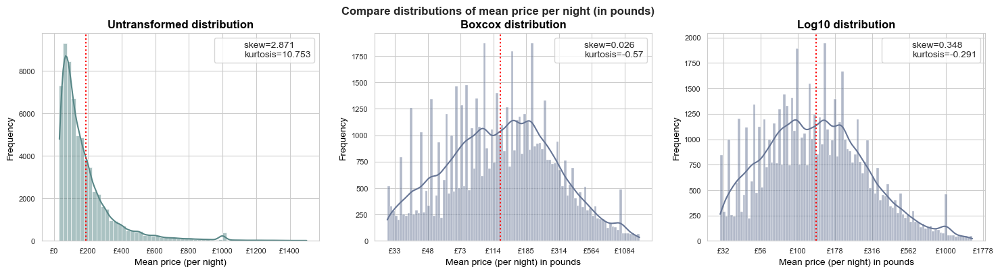

In [21]:
plt.figure(figsize=(18, 4))

plt.subplot(1, 3, 1)
xbinsize = 25
xbins = np.arange(0, listing_clean['price_mean'].max()+xbinsize, xbinsize)
ax1 = sns.histplot(data=listing_clean,
                   x='price_mean',
                   bins=xbins,
                   kde=True,
                   color=BASE_COLOR_SUB1)

plt.axvline(x=listing_clean['price_mean'].mean(), color='r', linestyle=':')
xticks = ax1.get_xticks()
labels = ['£{:1.0f}'.format(tick) for tick in xticks]
plt.xticks(xticks, labels)
plt.title('Untransformed distribution')
plt.xlabel('Mean price (per night)')
plt.ylabel('Frequency')
plt.subplot(1, 3, 2)

df = pd.DataFrame()
df['price_mean'], fitted_lambda = stats.boxcox(listing_clean['price_mean'])
ax2 = sns.histplot(data=df,
                   x='price_mean',
                   bins=100,
                   color=BASE_COLOR_SUB2,
                   kde=True)

plt.axvline(x=df['price_mean'].mean(), color='r', linestyle=':')
xticks = ax2.get_xticks()
labels = ['£{:1.0f}'.format(
    inv_boxcox(tick, fitted_lambda)) for tick in xticks]

plt.xticks(xticks, labels)
plt.title('Boxcox distribution')
plt.xlabel('Mean price (per night) in pounds')
plt.ylabel('Frequency')

plt.subplot(1, 3, 3)

df2 = pd.DataFrame()
df2['price_mean'] = log_transform(listing_clean['price_mean'])
ax3 = sns.histplot(data=df2,
                   x='price_mean',
                   bins=100,
                   color=BASE_COLOR_SUB2,
                   kde=True)

plt.axvline(x=df2['price_mean'].mean(), color='r', linestyle=':')
xticks = ax3.get_xticks()
labels = ['£{:1.0f}'.format(inverse_log_transform(tick)) for tick in xticks]
plt.xticks(xticks, labels)
plt.title('Log10 distribution')
plt.xlabel('Mean price (per night) in pounds')
plt.ylabel('Frequency')

plt.suptitle('Compare distributions of mean price per night (in pounds)')

# Add the skew and kurtosis score in the legend of each axis
for ax, df in zip(
                 [ax1, ax2, ax3],
                 [listing_clean['price_mean'],
                  df['price_mean'],
                  df2['price_mean']]):
    skew = round(df.skew(), 3)
    kurtosis = round(df.kurtosis(), 3)
    ax.plot([], [], " ", label=f"skew={skew} \nkurtosis={kurtosis}")
    ax.legend(loc='upper right', fontsize=10)

plt.show()

>**Observation:** Mean price is kind of normally distributed on both boxcox and log10 scale. Log10 scale seems to have higher density around the mean

#### Which transformation strategy to use ?

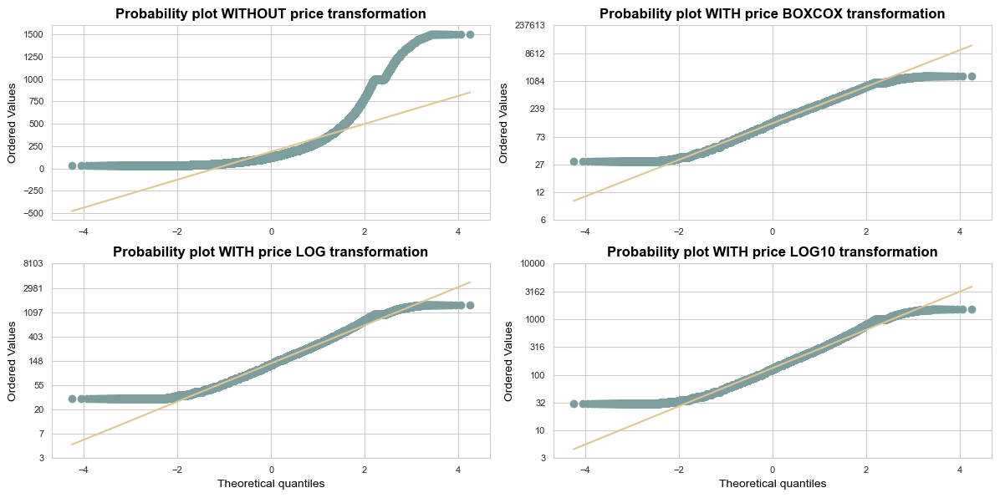

In [22]:
fig = plt.figure(figsize=(12, 6))

ax1 = fig.add_subplot(221)
xt = listing_clean['price_mean']
stats.probplot(xt, dist=stats.norm, plot=ax1)
ax1.set_xlabel('')
ax1.set_title('Probability plot WITHOUT price transformation')
ax1.get_lines()[0].set_color(BASE_COLOR)
ax1.get_lines()[1].set_color(BASE_COMPLIMENTARY)

ax2 = fig.add_subplot(222)
xt, fitted_lambda = stats.boxcox(listing_clean['price_mean'])
stats.probplot(xt, dist=stats.norm, plot=ax2)
ax2.set_title('Probability plot WITH price BOXCOX transformation')
ax2.set_xlabel('')
yticks = ax2.get_yticks()
labels = ['{:1.0f}'.format(inv_boxcox(tick, fitted_lambda)) for tick in yticks]
plt.yticks(yticks, labels)
ax2.get_lines()[0].set_color(BASE_COLOR)
ax2.get_lines()[1].set_color(BASE_COMPLIMENTARY)

ax3 = fig.add_subplot(223)
xt = np.log1p(listing_clean['price_mean'])
stats.probplot(xt, dist=stats.norm, plot=ax3)
ax3.set_title('Probability plot WITH price LOG transformation')
yticks = ax3.get_yticks()
labels = ['{:1.0f}'.format(np.exp(tick)) for tick in yticks]
plt.yticks(yticks, labels)
ax3.get_lines()[0].set_color(BASE_COLOR)
ax3.get_lines()[1].set_color(BASE_COMPLIMENTARY)

ax4 = fig.add_subplot(224)
xt = log_transform(listing_clean['price_mean'])
stats.probplot(xt, dist=stats.norm, plot=ax4)
ax4.set_title('Probability plot WITH price LOG10 transformation')
yticks = ax4.get_yticks()
labels = ['{:1.0f}'.format(inverse_log_transform(tick)) for tick in yticks]
plt.yticks(yticks, labels)
ax4.get_lines()[0].set_color(BASE_COLOR)
ax4.get_lines()[1].set_color(BASE_COMPLIMENTARY)

plt.tight_layout()

#### Let's double-check the distribution of independent variables

In [23]:
# we want different approaches for numeric vs categorical features
numerical_features = listing_clean.select_dtypes(
    include='number').columns.tolist()

numerical_features.remove('price_mean')
numerical_features.remove('latitude')
numerical_features.remove('longitude')

categorical_features = listing_clean.select_dtypes(
    exclude='number').columns.tolist()

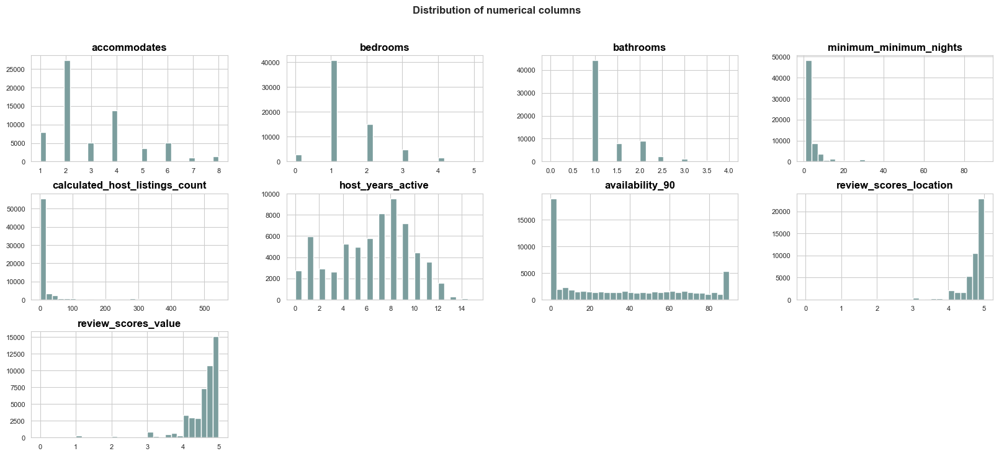

In [24]:
# distribution of numerical columns
pd.plotting.hist_frame(listing_clean,
                       figsize=(20, 8),
                       bins=30,
                       layout=(3, 4),
                       column=numerical_features,
                       xlabelsize=8,
                       ylabelsize=8,
                       color=BASE_COLOR)
plt.suptitle('Distribution of numerical columns')
plt.show()

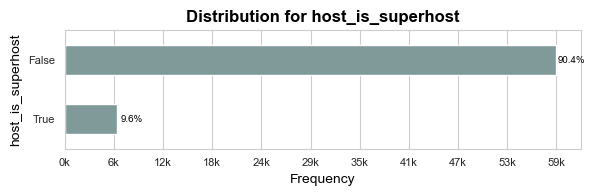

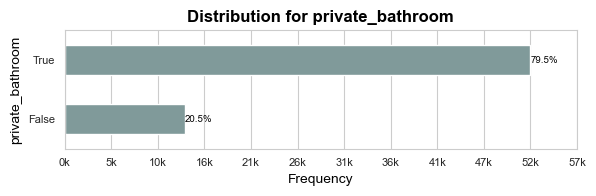

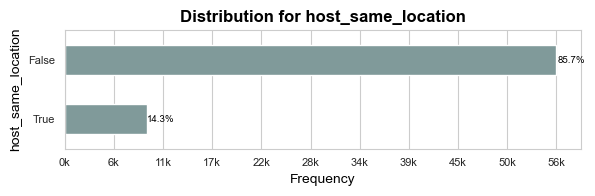

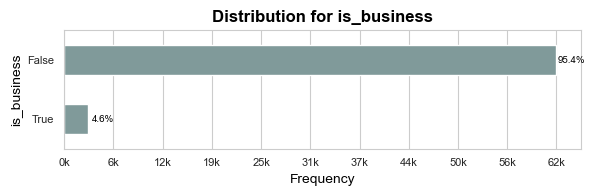

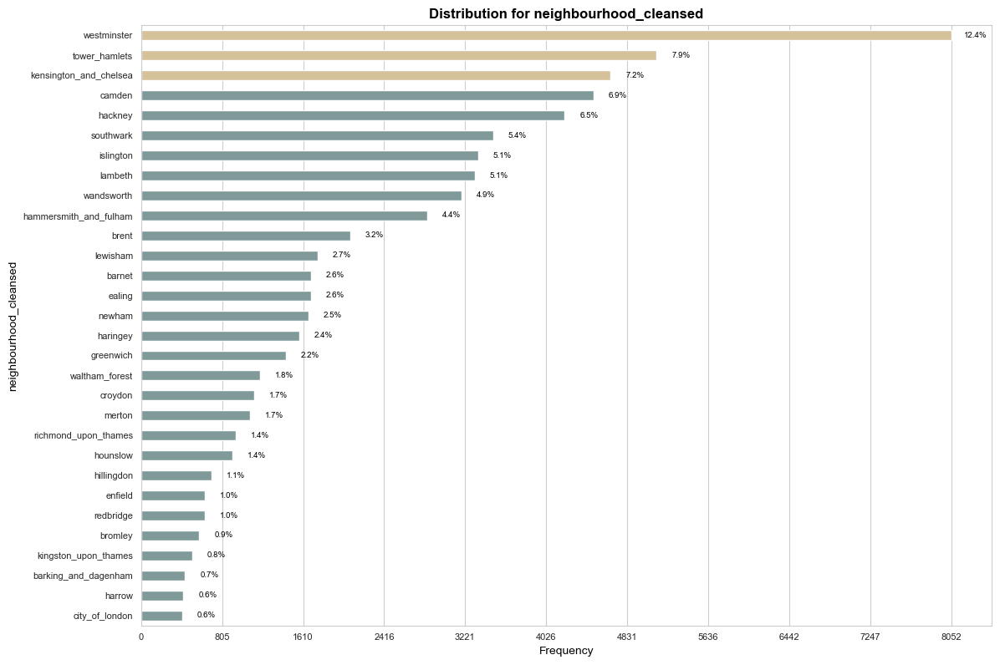

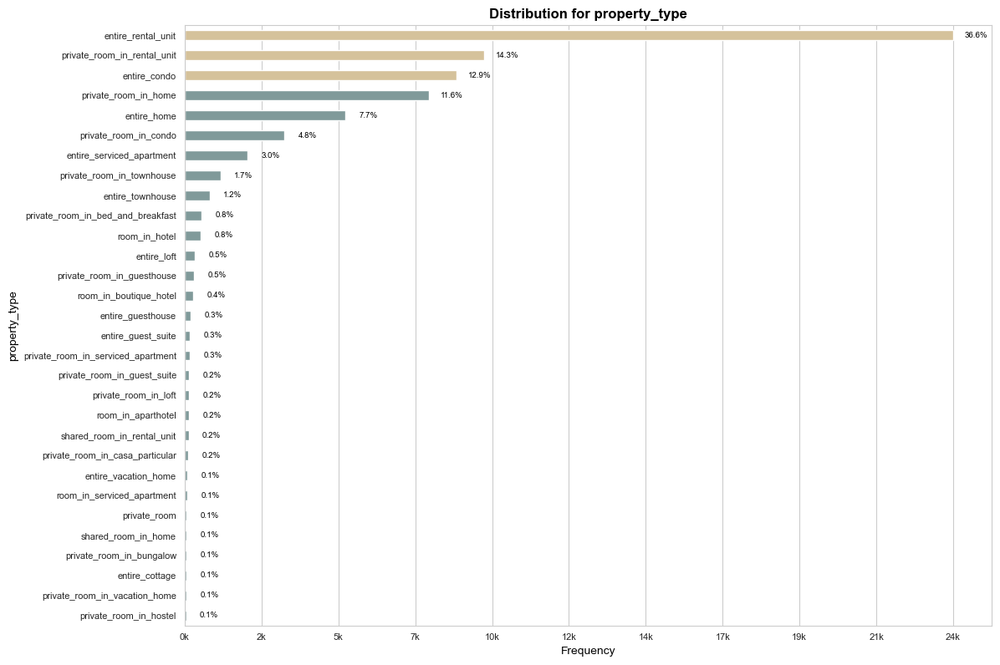

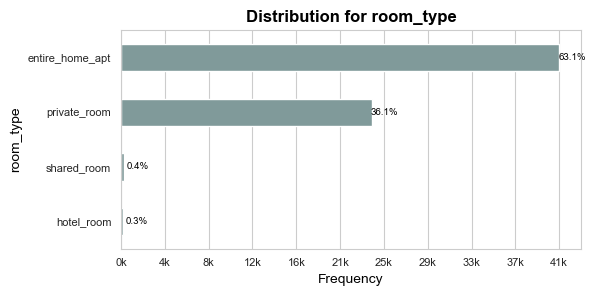

In [25]:
# plot distributions for categorical features
for col in categorical_features:
    vs.hist_by_cat(df=listing_clean, col=col, topn=30)

<a id='bivariate'></a>
<span style="color:blue; font-size:30px; line-height:40px; font-family: Calibri;">Bivariate Analysis</span>

#### Correlation analysis
- Select features correlated with price
- Make sure independent variables does not have too high correlations with each other

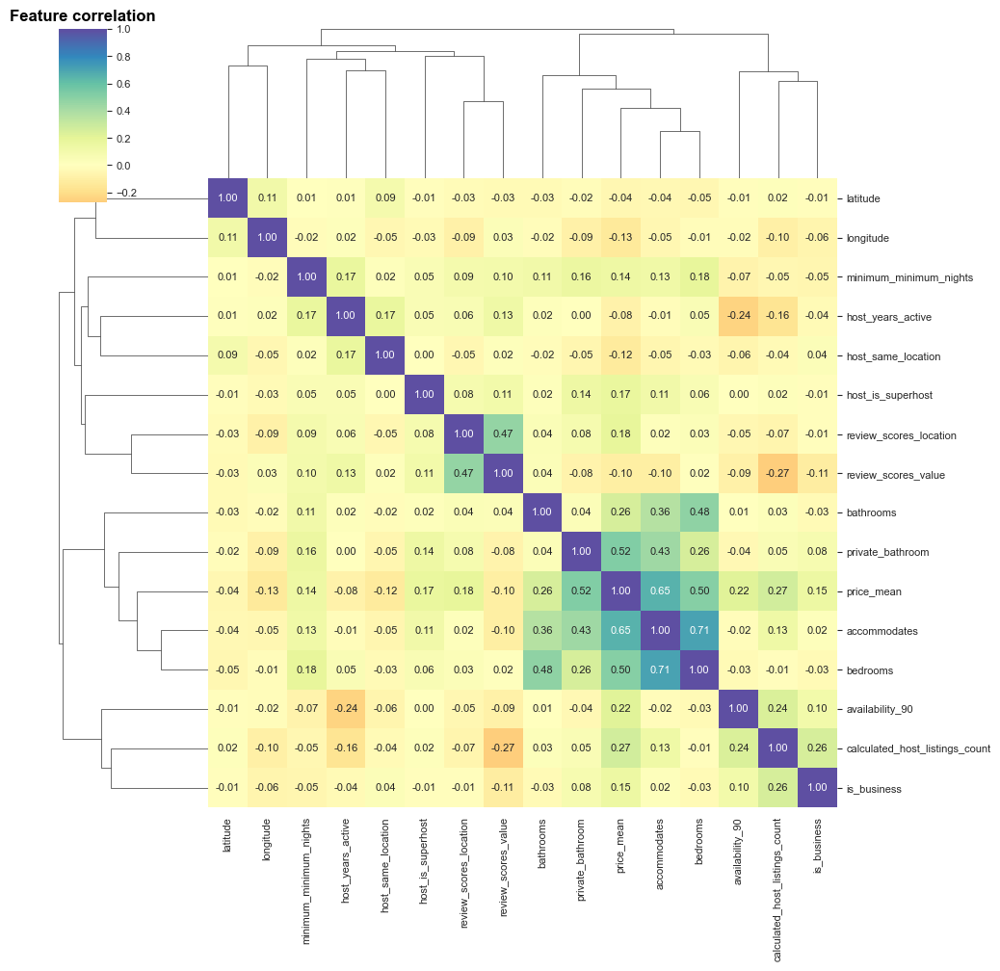

In [26]:
df_corr = listing_clean.corr(
    method='spearman',
    numeric_only=True,
    min_periods=1)

sns.clustermap(df_corr,
               cmap="Spectral",
               center=0,
               annot=True,
               fmt='.2f',
               annot_kws={"fontsize": 8},
               figsize=(10, 10))

plt.title('Feature correlation')
plt.xticks(fontsize=10)
plt.show()

#### Which kind of relationship features have with price ?

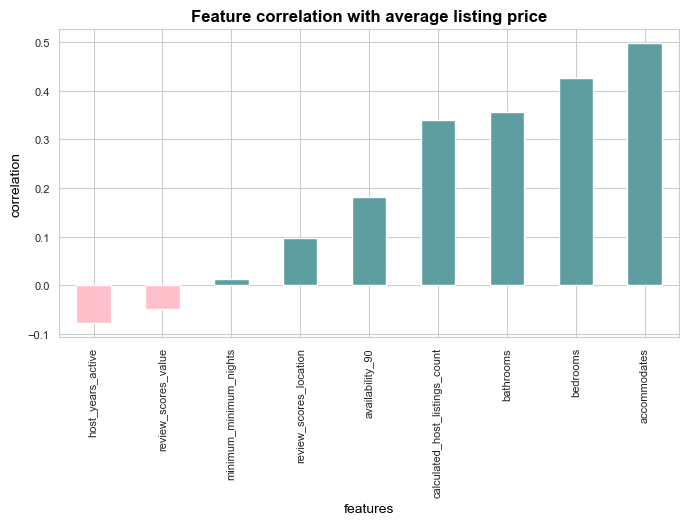

In [27]:
#  Get the strongest correlation of features with mean price
corr_matrix = listing_clean[numerical_features].corrwith(
    listing_clean["price_mean"]).sort_values()

# Plot feature correlations to no_show
palette = sns.color_palette("viridis_r", 15)
pos = 'cadetblue'
neg = 'pink'
corr_matrix.plot(
    kind='bar',
    color=np.vectorize({True: pos, False: neg}.get)(corr_matrix > 0))

plt.xticks(rotation='vertical')
plt.ylabel('correlation')
plt.xlabel('features')
plt.title('Feature correlation with average listing price')
plt.show()

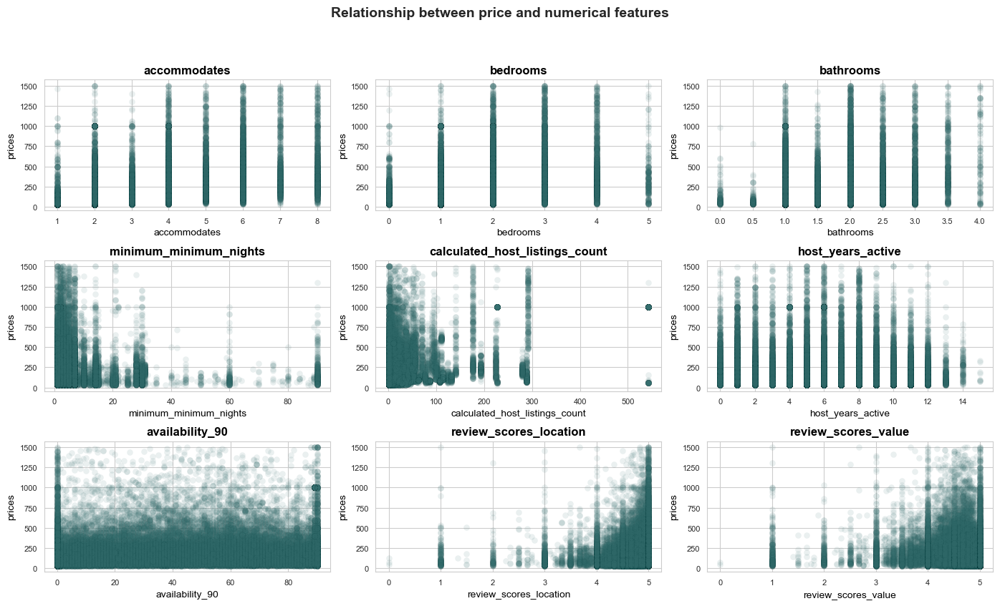

In [28]:
# Display relationship between price and numerical features
plt.figure(figsize=(14, 8))
for i, col in enumerate(numerical_features):
    plt.subplot(3, 3, i+1)
    sns.scatterplot(x=listing_clean[col],
                    y=listing_clean['price_mean'],
                    alpha=0.1,
                    color=BASE_HIGHLIGHT_INTENSE,
                    edgecolor='black',
                    linewidth=0.05)
    plt.title(col)
    plt.xlabel(col)
    plt.ylabel('prices')

plt.suptitle('Relationship between price and numerical features',
             fontsize=14,
             y=1.05)

plt.tight_layout()

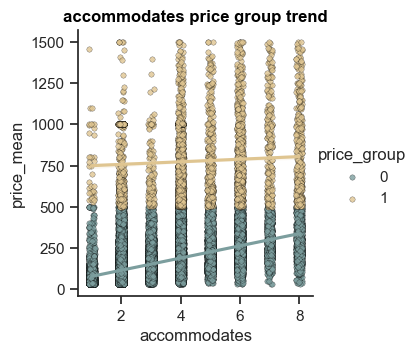

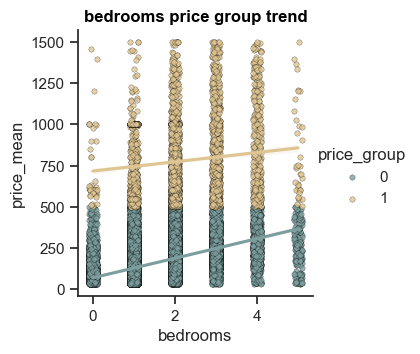

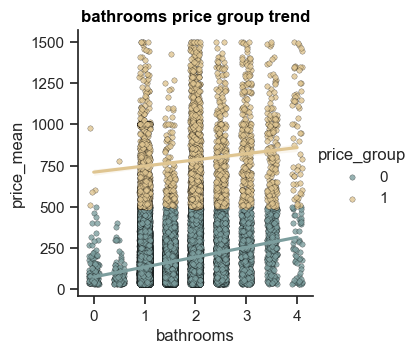

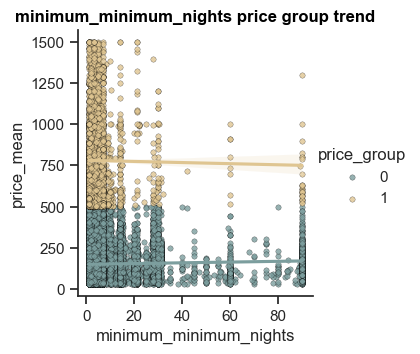

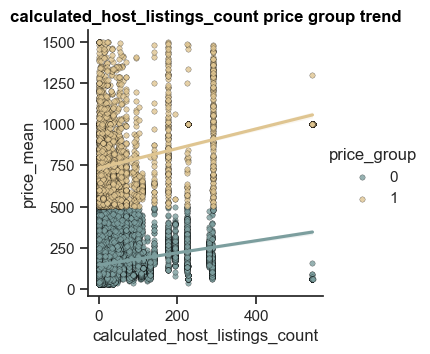

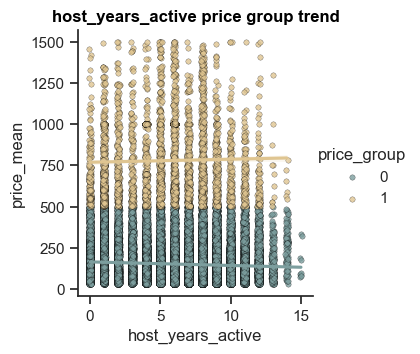

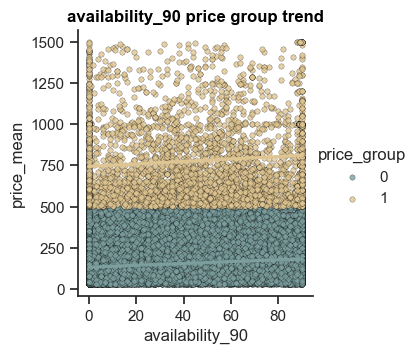

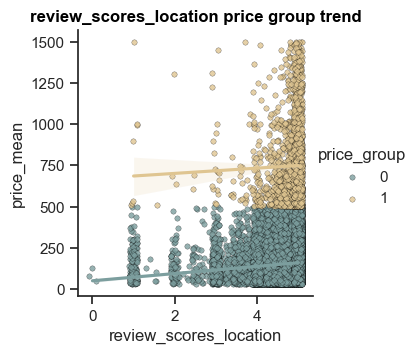

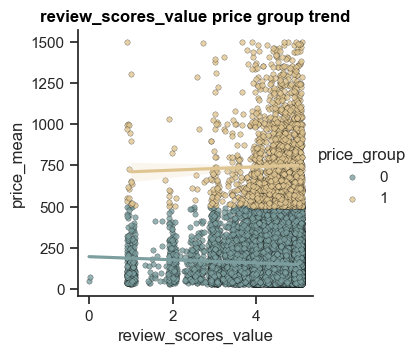

In [29]:
# Does features have a linear relationship with price ?

listing_clean['price_group'] = np.where(
    listing_clean['price_mean'] <= 500, 0, 1)

sns.set(style='ticks')
x_vars = numerical_features

for col in x_vars:
    ax = sns.lmplot(data=listing_clean,
                    x=col,
                    y='price_mean',
                    hue='price_group',
                    x_jitter=0.1,
                    palette=[BASE_COLOR, BASE_COMPLIMENTARY],
                    scatter_kws={'s': 15,
                                 'edgecolor': 'black',
                                 'linewidths': 0.2},
                    height=3.5)

    ax = plt.gca()
    ax.set_title('{} price group trend'.format(col))

plt.show()

# reset default plot formatting back
BASE_COLOR, BASE_HIGHLIGHT_INTENSE, BASE_HIGHLIGHT, \
    BASE_COMPLEMENTRY, BASE_GREY, BASE_COLOR_ARR, \
    BASE_COLOR_DEP, SYMBOLS = vs.set_plot_defaults()

>**Observation:** A linear relationship can be observed in most cases, however the slop of the fit changes for prices below and above £500, especially for number of bedrooms, bathrooms and number of people that can be accommodated.

<a id='multivariate'></a>
<span style="color:blue; font-size:30px; line-height:40px; font-family: Calibri;">Multivariate Analysis</span>

### Interaction analysis

Do features like neighbourhood and room type change the relationship some features have with price ?

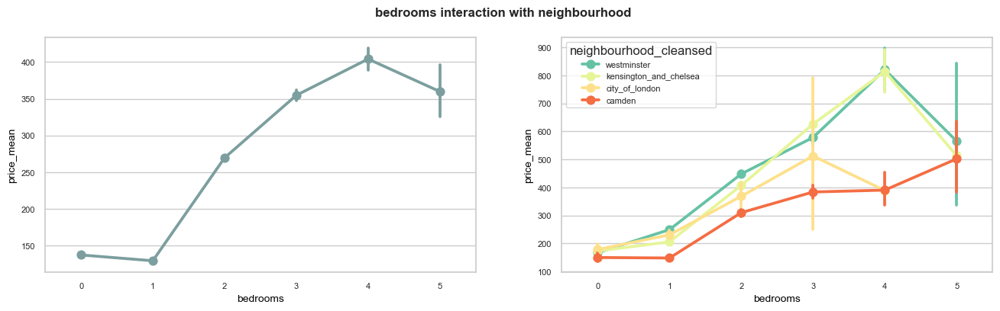

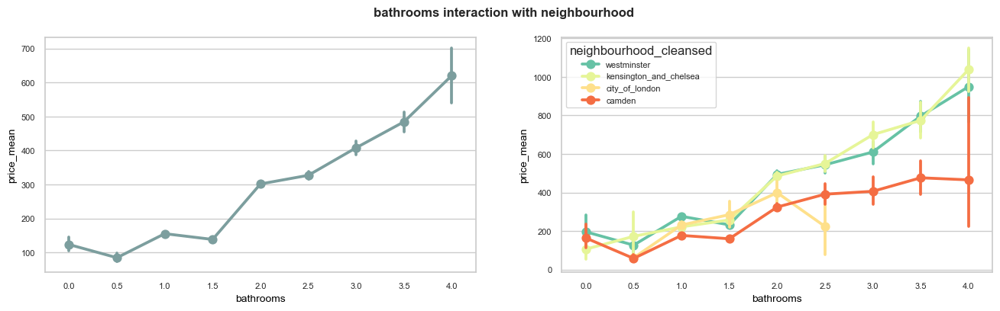

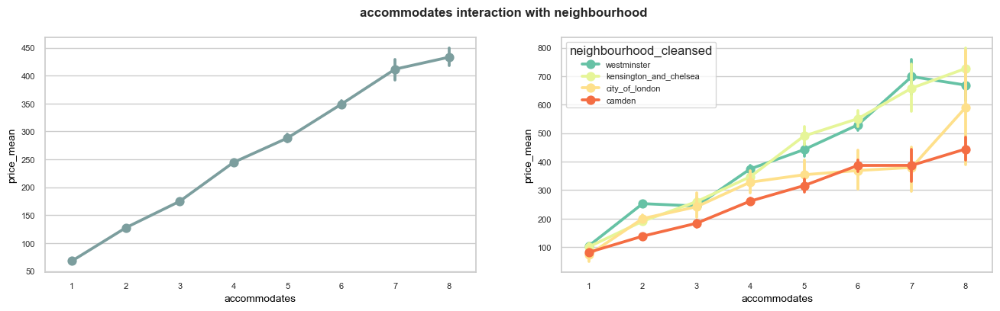

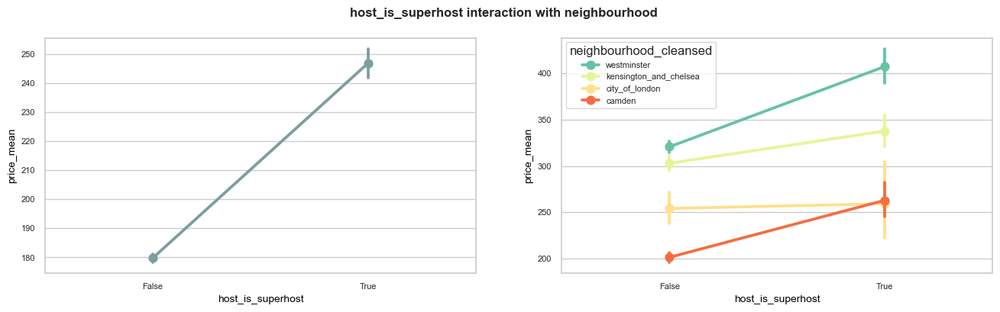

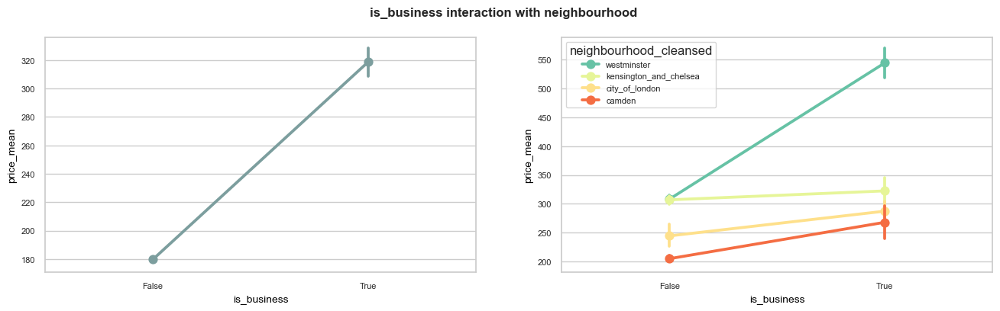

In [30]:
# Interaction with neighbourhood
cat = listing_clean.groupby(
    'neighbourhood_cleansed',
    observed=False)['price_mean'].mean().sort_values(ascending=False)

hue_order = list(cat.index)

for col in ['bedrooms',
            'bathrooms',
            'accommodates',
            'host_is_superhost',
            'is_business']:

    fig = plt.figure(figsize=(16, 4))
    plt.subplot(1, 2, 1)
    sns.pointplot(data=listing_clean, x=col, y="price_mean",  color=BASE_COLOR)

    plt.subplot(1, 2, 2)
    sns.pointplot(data=listing_clean,
                  x=col, y="price_mean",
                  hue='neighbourhood_cleansed',
                  hue_order=hue_order[:4],
                  palette='Spectral_r')

    plt.suptitle('{} interaction with neighbourhood'.format(col))

plt.show()

>**Observation:** There are indeed a lot of interactions introduced when we add features like neighbourhood and room type. Linear regression patterns can be observed, but the slope of the lines are changing for each neighbourhood

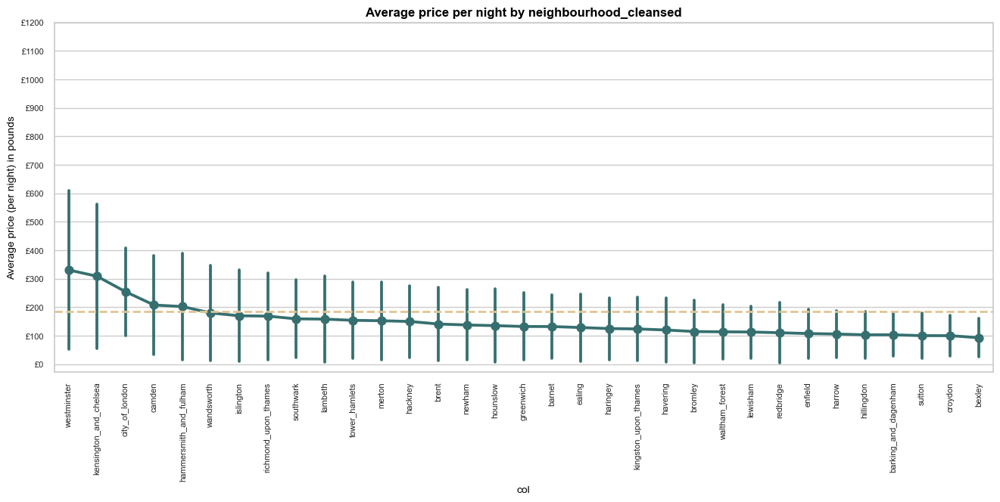

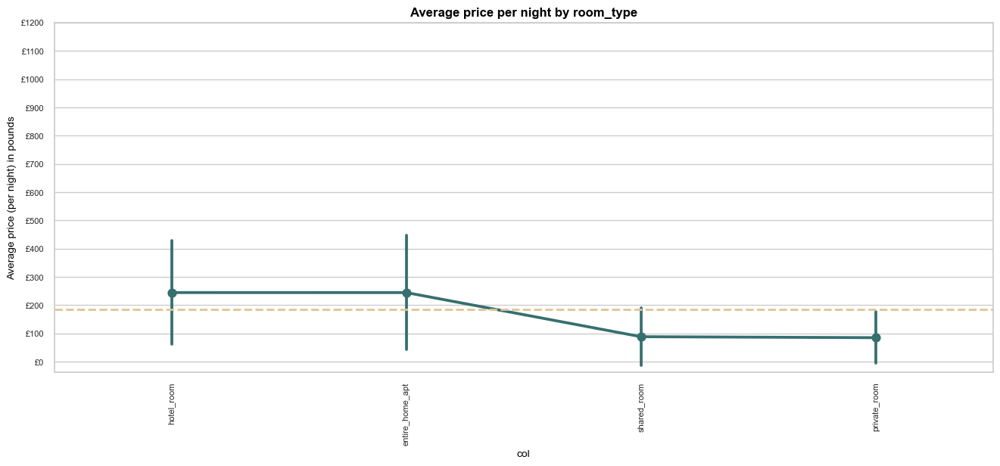

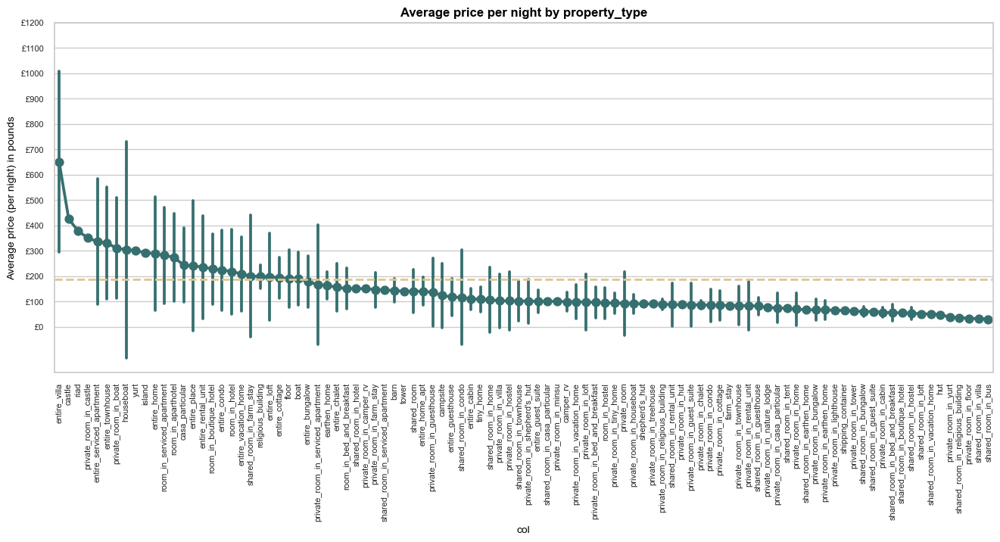

In [31]:
for col in ['neighbourhood_cleansed', 'room_type', 'property_type']:

    avg_price = listing_clean['price_mean'].mean()
    cat = listing_clean.groupby(
        col,
        observed=False)['price_mean'].mean().sort_values(ascending=False)

    order = list(cat.index)

    plt.figure(figsize=(16, 6))
    ax = sns.pointplot(data=listing_clean,
                       x=col,
                       y='price_mean',
                       errorbar='sd',
                       marker='o',
                       order=order,
                       color=BASE_HIGHLIGHT_INTENSE)

    ax.axhline(avg_price,
               color=BASE_COMPLIMENTARY,
               linestyle="dashed",
               linewidth=2)

    plt.title('Average price per night by {}'.format(col))
    plt.ylabel('Average price (per night) in pounds')
    plt.xlabel('col')
    plt.xticks(rotation=90)
    yticks = np.arange(0, 1300, 100)
    ylabels = ['£{:1.0f}'.format(tick) for tick in yticks]
    plt.yticks(yticks, ylabels)
    plt.show()

>**Observation:** 
>  - Neighbourhood:
>    - There's a constant variation in price between neighbourhoods, however more variation are observed in `Westminster` and `Kensington and Chelsea`
>    - Only the top 6 neighbourhoods show mean prices of above £200 per night, all other neighbourhoods have prices below £200
>  
>  - Room type:
>    - Entire homes and hotels show mean prices of above £200 per night, all other room types have prices below £200
>   
>  - Property type:
>    - Around 10 property types have extreme mean prices above £300 per night, with lots of variability like entire villas and townhouses
   

### Let's explore a bit deeper the relationship between price and each type of room

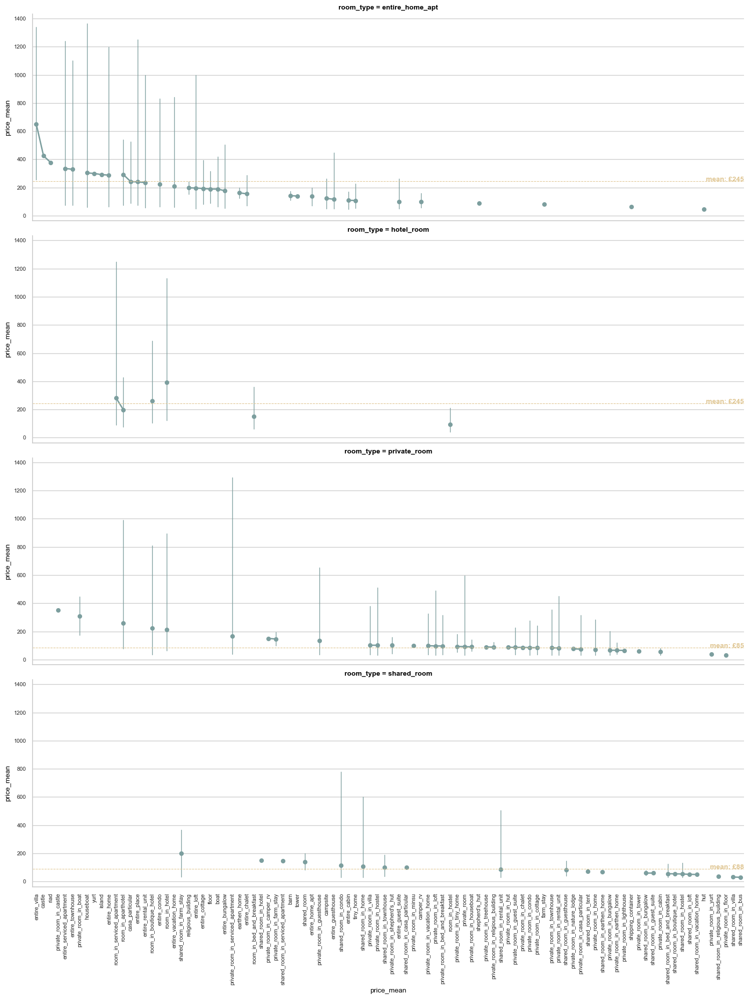

In [32]:
g = sns.FacetGrid(data=listing_clean,
                  row='room_type',
                  height=5,
                  aspect=3,
                  sharex=True,
                  sharey=True)

g.map(sns.pointplot,
      'property_type',
      'price_mean',
      order=order,
      errorbar=('pi', 97.5),
      seed=88,
      linestyles=None,
      linewidth=2,
      err_kws={'linewidth': 1}, color=BASE_COLOR)

g = g.map(vs.custom_mean_line,
          'price_mean',
          color=BASE_COMPLIMENTARY,
          ha='right',
          fontsize=10,
          weight='bold',
          lw=3)

plt.xticks(rotation=90)
plt.tight_layout()

>**Observation**:
>- Hotel rooms and entire homes or apartments show prices above £200 per night, whilst shared rooms and private rooms show prices below £100 per night

<a id='clustering'></a>
### Let's use clustering to build a better price grouping

We have over 80 property types which could make the model after one-hot encoding too complex and cause over fitting. 
We could use room type instead, but this has only 4 categories with so much variation in price, it's too simple for modelling. 

- Let's use both room type and property type, but cluster it for simplification.
- Let's minimize the interacts location, room type and property type brings, whilst getting rid of some of the relations between independent features like room type and property type

In [33]:
# encode selected categorical variables first before clustering

X_property = listing_clean[['room_type',
                            'property_type',
                            'latitude',
                            'longitude']].copy(deep=True)

onehot_cluster = Pipeline(
    steps=[('one-hot',
            OneHotEncoder(handle_unknown='ignore',
                          sparse_output=False, dtype='int'))])

cluster_preprocessor = ColumnTransformer(
    transformers=[('category',
                   onehot_cluster,
                   ['property_type', 'room_type']),],
    verbose_feature_names_out=False,
    remainder='passthrough'
)

_ = cluster_preprocessor.fit(X_property).set_output(transform="pandas")

X_property_transformed = cluster_preprocessor.transform(X_property)
X_property_transformed.head(2)

,property_type_barn,property_type_boat,property_type_camper_rv,property_type_campsite,property_type_casa_particular,property_type_castle,property_type_earthen_home,property_type_entire_bungalow,property_type_entire_cabin,property_type_entire_chalet,property_type_entire_condo,property_type_entire_cottage,property_type_entire_guest_suite,property_type_entire_guesthouse,property_type_entire_home,property_type_entire_home_apt,property_type_entire_loft,property_type_entire_place,property_type_entire_rental_unit,property_type_entire_serviced_apartment,property_type_entire_townhouse,property_type_entire_vacation_home,property_type_entire_villa,property_type_farm_stay,property_type_floor,property_type_houseboat,property_type_hut,property_type_island,property_type_private_room,property_type_private_room_in_bed_and_breakfast,property_type_private_room_in_boat,property_type_private_room_in_bungalow,property_type_private_room_in_cabin,property_type_private_room_in_camper_rv,property_type_private_room_in_casa_particular,property_type_private_room_in_castle,property_type_private_room_in_chalet,property_type_private_room_in_condo,property_type_private_room_in_cottage,property_type_private_room_in_earthen_home,property_type_private_room_in_farm_stay,property_type_private_room_in_floor,property_type_private_room_in_guest_suite,property_type_private_room_in_guesthouse,property_type_private_room_in_home,property_type_private_room_in_hostel,property_type_private_room_in_houseboat,property_type_private_room_in_hut,property_type_private_room_in_lighthouse,property_type_private_room_in_loft,property_type_private_room_in_minsu,property_type_private_room_in_nature_lodge,property_type_private_room_in_religious_building,property_type_private_room_in_rental_unit,property_type_private_room_in_serviced_apartment,property_type_private_room_in_shepherd's_hut,property_type_private_room_in_tiny_home,property_type_private_room_in_tower,property_type_private_room_in_townhouse,property_type_private_room_in_treehouse,property_type_private_room_in_vacation_home,property_type_private_room_in_villa,property_type_private_room_in_yurt,property_type_religious_building,property_type_riad,property_type_room_in_aparthotel,property_type_room_in_bed_and_breakfast,property_type_room_in_boutique_hotel,property_type_room_in_hostel,property_type_room_in_hotel,property_type_room_in_serviced_apartment,property_type_shared_room,property_type_shared_room_in_bed_and_breakfast,property_type_shared_room_in_boutique_hotel,property_type_shared_room_in_bungalow,property_type_shared_room_in_bus,property_type_shared_room_in_casa_particular,property_type_shared_room_in_condo,property_type_shared_room_in_earthen_home,property_type_shared_room_in_farm_stay,property_type_shared_room_in_guest_suite,property_type_shared_room_in_guesthouse,property_type_shared_room_in_home,property_type_shared_room_in_hostel,property_type_shared_room_in_hotel,property_type_shared_room_in_loft,property_type_shared_room_in_religious_building,property_type_shared_room_in_rental_unit,property_type_shared_room_in_serviced_apartment,property_type_shared_room_in_tent,property_type_shared_room_in_townhouse,property_type_shared_room_in_vacation_home,property_type_shared_room_in_villa,property_type_shepherd’s_hut,property_type_shipping_container,property_type_tiny_home,property_type_tower,property_type_yurt,room_type_entire_home_apt,room_type_hotel_room,room_type_private_room,room_type_shared_room,latitude,longitude,price_mean
listing_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
157714,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,51.48974,-0.22208,70
13913,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

Let's use **gausian mixture model (GMM)** algorithm to do clustering, as it will look for clusters that have a normal price distribution within each cluster, which will provide a better split

In [34]:
# Clustering
gmm = GaussianMixture(n_components=25,
                      random_state=random_state,
                      covariance_type='spherical',
                      init_params='k-means++')
X_property_transformed['cluster'] = gmm.fit_predict(X_property_transformed)
X_property_transformed.head(2)

,property_type_barn,property_type_boat,property_type_camper_rv,property_type_campsite,property_type_casa_particular,property_type_castle,property_type_earthen_home,property_type_entire_bungalow,property_type_entire_cabin,property_type_entire_chalet,property_type_entire_condo,property_type_entire_cottage,property_type_entire_guest_suite,property_type_entire_guesthouse,property_type_entire_home,property_type_entire_home_apt,property_type_entire_loft,property_type_entire_place,property_type_entire_rental_unit,property_type_entire_serviced_apartment,property_type_entire_townhouse,property_type_entire_vacation_home,property_type_entire_villa,property_type_farm_stay,property_type_floor,property_type_houseboat,property_type_hut,property_type_island,property_type_private_room,property_type_private_room_in_bed_and_breakfast,property_type_private_room_in_boat,property_type_private_room_in_bungalow,property_type_private_room_in_cabin,property_type_private_room_in_camper_rv,property_type_private_room_in_casa_particular,property_type_private_room_in_castle,property_type_private_room_in_chalet,property_type_private_room_in_condo,property_type_private_room_in_cottage,property_type_private_room_in_earthen_home,property_type_private_room_in_farm_stay,property_type_private_room_in_floor,property_type_private_room_in_guest_suite,property_type_private_room_in_guesthouse,property_type_private_room_in_home,property_type_private_room_in_hostel,property_type_private_room_in_houseboat,property_type_private_room_in_hut,property_type_private_room_in_lighthouse,property_type_private_room_in_loft,property_type_private_room_in_minsu,property_type_private_room_in_nature_lodge,property_type_private_room_in_religious_building,property_type_private_room_in_rental_unit,property_type_private_room_in_serviced_apartment,property_type_private_room_in_shepherd's_hut,property_type_private_room_in_tiny_home,property_type_private_room_in_tower,property_type_private_room_in_townhouse,property_type_private_room_in_treehouse,property_type_private_room_in_vacation_home,property_type_private_room_in_villa,property_type_private_room_in_yurt,property_type_religious_building,property_type_riad,property_type_room_in_aparthotel,property_type_room_in_bed_and_breakfast,property_type_room_in_boutique_hotel,property_type_room_in_hostel,property_type_room_in_hotel,property_type_room_in_serviced_apartment,property_type_shared_room,property_type_shared_room_in_bed_and_breakfast,property_type_shared_room_in_boutique_hotel,property_type_shared_room_in_bungalow,property_type_shared_room_in_bus,property_type_shared_room_in_casa_particular,property_type_shared_room_in_condo,property_type_shared_room_in_earthen_home,property_type_shared_room_in_farm_stay,property_type_shared_room_in_guest_suite,property_type_shared_room_in_guesthouse,property_type_shared_room_in_home,property_type_shared_room_in_hostel,property_type_shared_room_in_hotel,property_type_shared_room_in_loft,property_type_shared_room_in_religious_building,property_type_shared_room_in_rental_unit,property_type_shared_room_in_serviced_apartment,property_type_shared_room_in_tent,property_type_shared_room_in_townhouse,property_type_shared_room_in_vacation_home,property_type_shared_room_in_villa,property_type_shepherd’s_hut,property_type_shipping_container,property_type_tiny_home,property_type_tower,property_type_yurt,room_type_entire_home_apt,room_type_hotel_room,room_type_private_room,room_type_shared_room,latitude,longitude,price_mean,cluster
listing_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
157714,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,51.48974,-0.22208,70,0
13913,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [35]:
# display the min/max prices for each cluster
# to check if the price groups make sense
tmp = X_property_transformed.groupby('cluster').agg(
    min=('price_mean', 'min'),
    max=('price_mean', 'max'),
    nr_listings=('cluster', 'count')).sort_values(by='min')
tmp['rank'] = tmp['min'].rank(method='max').astype('int')
tmp

,min,max,nr_listings,rank
cluster,,,,
17,30,47,6708,1
0,48,70,8896,2
16,71,91,7357,3
9,92,107,4771,4
22,108,126,4559,5
7,127,145,3813,6
18,146,172,5269,7
4,173,206,5592,8
14,207,236,3117,9


In [36]:
# resquence the cluster names by price
mymap = pd.Series(tmp['rank'].values, index=tmp.index).to_dict()
mymap

{17: 1,
 0: 2,
 16: 3,
 9: 4,
 22: 5,
 7: 6,
 18: 7,
 4: 8,
 14: 9,
 20: 10,
 2: 11,
 13: 12,
 8: 13,
 19: 14,
 5: 15,
 23: 16,
 10: 17,
 1: 18,
 12: 19,
 3: 20,
 24: 21,
 11: 22,
 15: 23,
 6: 24,
 21: 25}

In [37]:
# rename clusters to sequence them into ranked order
X_property_transformed['property_cluster'] = \
    X_property_transformed['cluster'].map(mymap)

In [38]:
# add cluster to main dataset and double check correctness
listing_clean['property_cluster'] = X_property_transformed['property_cluster']
listing_clean.head(3)

,host_is_superhost,accommodates,bedrooms,bathrooms,minimum_minimum_nights,calculated_host_listings_count,host_years_active,price_mean,private_bathroom,host_same_location,is_business,availability_90,neighbourhood_cleansed,property_type,room_type,review_scores_location,review_scores_value,latitude,longitude,price_group,property_cluster
listing_id,,,,,,,,,,,,,,,,,,,,,
157714,False,3,1,1.5,4,1,12,70,True,True,False,67,hammersmith_and_fulham,private_room_in_townhouse,private_room,4.76,4.66,51.48974,-0.22208,0,2
13913,False,1,1,1.0,1,2,14,79,False,True,False,78,islington,private_room_in_rental_unit,private_room,4.69,4.69,51.56861,-0.11270,0,3
15400,False,2,1,1.0,7,1,14,107,True,True,False,2,kensington_and_chelsea,entire_rental_unit,entire_home_apt,4.93,4.74,51.48780,-0.16813,0,4


### Let's use spatial analysis to visualize average prices in neighbourhoods more clearly

In [39]:
# make a geo spatial dataset with listing locations
cols = ['latitude', 'longitude', 'price_mean',
        'property_cluster', 'neighbourhood_cleansed']

listings_geo = listing_clean[cols].copy(deep=True)
listings_geo.rename(columns={'neighbourhood_cleansed': 'neighbourhood'},
                    inplace=True)
listings_geo.head()

,latitude,longitude,price_mean,property_cluster,neighbourhood
listing_id,,,,,
157714,51.48974,-0.22208,70,2,hammersmith_and_fulham
13913,51.56861,-0.11270,79,3,islington
15400,51.48780,-0.16813,107,4,kensington_and_chelsea
306333,51.52748,-0.08172,198,8,hackney
159736,51.46788,-0.09993,62,2,lambeth


In [40]:
# make geometry field
listings_geo['geometry'] = listings_geo.apply(
    lambda x: Point((x.longitude, x.latitude)), axis=1)
type(listings_geo)

pandas.core.frame.DataFrame

In [41]:
listings_geo = gpd.GeoDataFrame(listings_geo,
                                crs=crs_4326,
                                geometry=listings_geo.geometry)
listings_geo.head()

,latitude,longitude,price_mean,property_cluster,neighbourhood,geometry
listing_id,,,,,,
157714,51.48974,-0.22208,70,2,hammersmith_and_fulham,POINT (-0.222080000000000 51.489739999999998)
13913,51.56861,-0.11270,79,3,islington,POINT (-0.112700000000000 51.568610000000000)
15400,51.48780,-0.16813,107,4,kensington_and_chelsea,POINT (-0.168130000000000 51.487800000000000)
306333,51.52748,-0.08172,198,8,hackney,POINT (-0.081720000000000 51.527479999999997)
159736,51.46788,-0.09993,62,2,lambeth,POINT (-0.099930000000000 51.467880000000001)


In [42]:
# calculate average price per neighborhood
neigborhood_price = listings_geo.groupby(
    'neighbourhood', as_index=False, observed=False)['price_mean'].mean()

In [43]:
neighbourhood = neighbourhood.merge(neigborhood_price, on='neighbourhood')
neighbourhood.head()

,neighbourhood,neighbourhood_group,geometry,price_mean
0,kingston_upon_thames,None,MULTIPOLYGON (((-0.330679000000000 51.32901100...,123.725490
1,croydon,None,MULTIPOLYGON (((-0.064021000000000 51.31863800...,100.060284
2,bromley,None,MULTIPOLYGON (((0.012131000000000 51.299599000...,114.579585
3,hounslow,None,MULTIPOLYGON (((-0.244562000000000 51.48870200...,135.320796
4,ealing,None,MULTIPOLYGON (((-0.411833000000000 51.53408400...,128.708951


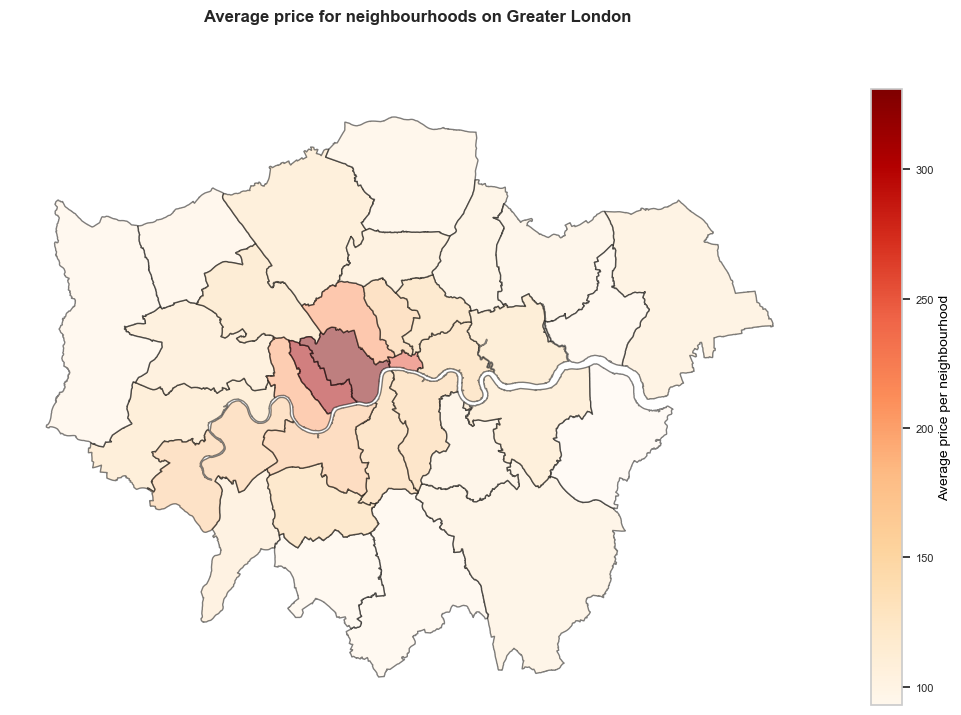

In [44]:
fig, ax = plt.subplots(1, 1, figsize=(16, 8))

lgnd_kwds = {'label': 'Average price per neighbourhood',
             'orientation': 'vertical'}

base = neighbourhood.plot(ax=ax,
                          column='price_mean',
                          edgecolor='black',
                          cmap='OrRd',
                          alpha=0.5,
                          zorder=1,
                          legend=True,
                          legend_kwds=lgnd_kwds)
base.set_axis_off()
plt.suptitle('Average price for neighbourhoods on Greater London',
             fontsize=12)
plt.show()

>**Observation**:
>- The closer we get to the centre of Greater London, the more expensive the listings get

### Visualize the new property  clusters

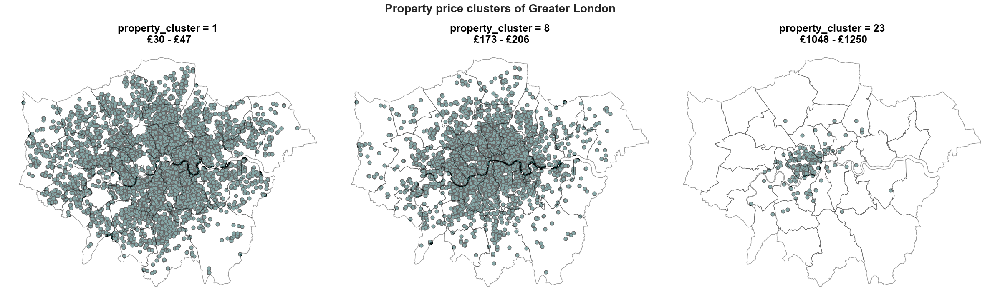

In [45]:
def spatial_mapping(data, color):
    """ Greater London neighbourhood map with listings"""
    price_min = data.price_mean.min()
    price_max = data.price_mean.max()
    ax = plt.gca()
    base = data.plot(ax=plt.gca(),
                     zorder=1,
                     marker='o',
                     markersize=40,
                     edgecolor="black",
                     linewidth=1,
                     color=BASE_HIGHLIGHT_INTENSE)

    neighbourhood.plot(color='white',
                       edgecolor='black',
                       zorder=2,
                       alpha=0.4,
                       ax=base)

    base.set_axis_off()
    new_title = ax.get_title() + '\n £{} - £{}'.format(price_min, price_max)
    ax.set_title(new_title, fontsize='18')


g = sns.FacetGrid(data=listings_geo,
                  col='property_cluster',
                  col_order=[1, 8, 23],
                  height=8,
                  aspect=1)

g.map_dataframe(spatial_mapping)

plt.suptitle('Property price clusters of Greater London', fontsize=20)
plt.tight_layout()

>**Observation**:
>- We have perfect clusters. Cluster 1 contains budget accommodation which can be found all over greater London. As the cluster number increase, prices becomes more expensive, and listings are more condensed around the centre. 

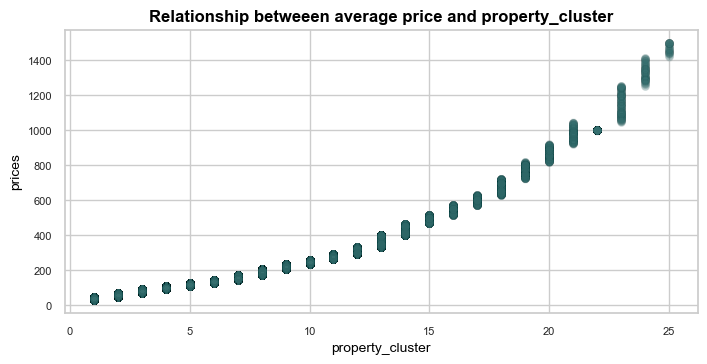

In [46]:
# analyse the relationship between the new property cluster and listing price
plt.figure(figsize=(20, 10))
for i, col in enumerate(['property_cluster']):
    plt.subplot(3, 3, i+1)
    sns.scatterplot(x=listing_clean[col],
                    y=listing_clean['price_mean'],
                    alpha=0.1,
                    color=BASE_HIGHLIGHT_INTENSE,
                    edgecolor='black',
                    linewidth=0.05)
    plt.title('Relationship betweeen average price and {}'.format(col))
    plt.xlabel(col)
    plt.ylabel('prices')
plt.tight_layout()

>**Observation**:
>- The relationship are not perfect linear, this might cause some problems.  It's a more curvy shape, which could lean towards polynomial regression.
>- It's rare for properties to have prices over £500, it's a more luxury market, which might be the reason for the curve.

<a id='preprocessing'></a>

<span style="color:blue; font-size:30px; line-height:40px; font-family: Calibri;">Model preprocessing</span>

In [47]:
# clear the garbage to free memory
gc.collect()

455

Drop the fields no longer needed for modelling after clustering. Even though room type and location was used during clustering, we will still keep the room type and neighborhood features, to help the model identify the extreme budget and luxury fluctuations.

In [48]:
try:
    listing_clean = listing_clean.drop(['latitude',
                                        'longitude',
                                        'price_group'], axis=1)
except Exception as ex:
    pass

listing_clean.head(3)

,host_is_superhost,accommodates,bedrooms,bathrooms,minimum_minimum_nights,calculated_host_listings_count,host_years_active,price_mean,private_bathroom,host_same_location,is_business,availability_90,neighbourhood_cleansed,property_type,room_type,review_scores_location,review_scores_value,property_cluster
listing_id,,,,,,,,,,,,,,,,,,
157714,False,3,1,1.5,4,1,12,70,True,True,False,67,hammersmith_and_fulham,private_room_in_townhouse,private_room,4.76,4.66,2
13913,False,1,1,1.0,1,2,14,79,False,True,False,78,islington,private_room_in_rental_unit,private_room,4.69,4.69,3
15400,False,2,1,1.0,7,1,14,107,True,True,False,2,kensington_and_chelsea,entire_rental_unit,entire_home_apt,4.93,4.74,4


In [49]:
# split the datasets into dependent and independent datasets
y = listing_clean['price_mean'].copy()
X = listing_clean.drop('price_mean', axis=1)

In [50]:
# we want different preprocessing steps for numeric vs categorical features
numerical_features = X.select_dtypes(include='number').columns.tolist()
print('Numerical features {}'.format(numerical_features))
categorical_features = X.select_dtypes(exclude='number').columns.tolist()
print('Categorical features {}'.format(categorical_features))

Numerical features ['accommodates', 'bedrooms', 'bathrooms', 'minimum_minimum_nights', 'calculated_host_listings_count', 'host_years_active', 'availability_90', 'review_scores_location', 'review_scores_value', 'property_cluster']
Categorical features ['host_is_superhost', 'private_bathroom', 'host_same_location', 'is_business', 'neighbourhood_cleansed', 'property_type', 'room_type']


As we will use cross validation in steps below, we want to avoid that each fold end up with different features when we drop sparse columns after one-hot encoding. We therefore do only the onehot encoding step before modelling, using the full datasets to ensure consistency.
As we now have a property cluster, we will only keep the top property types and get rid of exceptions to minimize interactions

In [51]:
# cleaning data / preprocessing step before we split out data into train/test
onehot_pipe = Pipeline(steps=[
    ('one-hot', OneHotEncoder(dtype='int',
                              drop="if_binary",
                              handle_unknown='infrequent_if_exist',
                              sparse_output=False,
                              min_frequency=40))
])

onehot_preprocessor = ColumnTransformer(transformers=[
    ('category', onehot_pipe, categorical_features),
],
        verbose_feature_names_out=False,
        remainder='passthrough'
                                       )

_ = onehot_preprocessor.fit(X).set_output(transform="pandas")

In [52]:
X_transformed = onehot_preprocessor.transform(X)
X_transformed.head()

,host_is_superhost_True,private_bathroom_True,host_same_location_True,is_business_True,neighbourhood_cleansed_barking_and_dagenham,neighbourhood_cleansed_barnet,neighbourhood_cleansed_bexley,neighbourhood_cleansed_brent,neighbourhood_cleansed_bromley,neighbourhood_cleansed_camden,neighbourhood_cleansed_city_of_london,neighbourhood_cleansed_croydon,neighbourhood_cleansed_ealing,neighbourhood_cleansed_enfield,neighbourhood_cleansed_greenwich,neighbourhood_cleansed_hackney,neighbourhood_cleansed_hammersmith_and_fulham,neighbourhood_cleansed_haringey,neighbourhood_cleansed_harrow,neighbourhood_cleansed_havering,neighbourhood_cleansed_hillingdon,neighbourhood_cleansed_hounslow,neighbourhood_cleansed_islington,neighbourhood_cleansed_kensington_and_chelsea,neighbourhood_cleansed_kingston_upon_thames,neighbourhood_cleansed_lambeth,neighbourhood_cleansed_lewisham,neighbourhood_cleansed_merton,neighbourhood_cleansed_newham,neighbourhood_cleansed_redbridge,neighbourhood_cleansed_richmond_upon_thames,neighbourhood_cleansed_southwark,neighbourhood_cleansed_sutton,neighbourhood_cleansed_tower_hamlets,neighbourhood_cleansed_waltham_forest,neighbourhood_cleansed_wandsworth,neighbourhood_cleansed_westminster,property_type_entire_bungalow,property_type_entire_condo,property_type_entire_cottage,property_type_entire_guest_suite,property_type_entire_guesthouse,property_type_entire_home,property_type_entire_loft,property_type_entire_place,property_type_entire_rental_unit,property_type_entire_serviced_apartment,property_type_entire_townhouse,property_type_entire_vacation_home,property_type_private_room,property_type_private_room_in_bed_and_breakfast,property_type_private_room_in_bungalow,property_type_private_room_in_casa_particular,property_type_private_room_in_condo,property_type_private_room_in_guest_suite,property_type_private_room_in_guesthouse,property_type_private_room_in_home,property_type_private_room_in_hostel,property_type_private_room_in_loft,property_type_private_room_in_rental_unit,property_type_private_room_in_serviced_apartment,property_type_private_room_in_townhouse,property_type_private_room_in_vacation_home,property_type_room_in_aparthotel,property_type_room_in_boutique_hotel,property_type_room_in_hotel,property_type_room_in_serviced_apartment,property_type_shared_room_in_home,property_type_shared_room_in_rental_unit,property_type_infrequent_sklearn,room_type_entire_home_apt,room_type_hotel_room,room_type_private_room,room_type_shared_room,accommodates,bedrooms,bathrooms,minimum_minimum_nights,calculated_host_listings_count,host_years_active,availability_90,review_scores_location,review_scores_value,property_cluster
listing_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
157714,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,3,1,1.5,4,1,12,67,4.76,4.66,2
13913,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,1.0,1,2,14,78,4.69,4.69,3
15400,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,2,1,1.0,7,1,14,2,4.93,4.74,4
306333,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,5,2,1.0,2,1,11,4,4.89,4.53,8
159736,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,2,1,1.0,4,4,12,2,4.34,4.66,2


In [53]:
# make sure property types are well presented in both training and testing sets
X_train, X_test, y_train, y_test = train_test_split(
    X_transformed,
    y,
    test_size=0.25,
    random_state=random_state,
    stratify=X_transformed[['property_cluster', 'is_business_True']],
)

In [54]:
# pre-processing pipeline
# scaling and impute data after splitting data into training and testing sets

numerical_preprocessor = Pipeline(steps=[
    ('impute', SimpleImputer(strategy='median')),
    ('scale', StandardScaler())
])

preprocessor = ColumnTransformer(transformers=[

    ('number', numerical_preprocessor, numerical_features),
],
                                 verbose_feature_names_out=False,
                                 remainder='passthrough'
                                )

<a id='baseline'></a>

<span style="color:blue; font-size:30px; line-height:40px; font-family: Calibri;">Modelling Step 1 - Setting a baseline</span>

2 baseline models will be created, 1 with target log transformation to make the distribution normal, and 1 without

As we are observed lots of interactions during EDA in the data when we introduce features `neighbourhood` and `room_type`, we will use the Ridge algorithm with regularization to minimize the impact

In [55]:
# As our base model, lets evaluate the performance of Ridge estimator
# with a very small alpha, with and without target log transformation

alpha_base = 1e-10

# without target transformation
base_model = Pipeline(
    [
        ("preprocess", preprocessor),
        ('selector', VarianceThreshold(0)),
        ("base", Ridge(alpha_base)),
    ]
)

# with target transformation on log scale with base 10
base_model_with_log_target = Pipeline(
    [
        ("preprocess", preprocessor),
        ('selector', VarianceThreshold(0)),
        ("base_transformed",
         TransformedTargetRegressor(regressor=Ridge(alpha_base),
                                    func=log_transform,
                                    inverse_func=inverse_log_transform)),
    ]
)

In [56]:
_ = base_model.fit(X_train,
                   y_train).set_output(transform="pandas")

In [57]:
_ = base_model_with_log_target.fit(X_train,
                                   y_train).set_output(transform="pandas")

## Evaluation: base model

In [58]:
# predict
y_train_preds = base_model.predict(X_train)
y_train_preds_transformed = base_model_with_log_target.predict(X_train)

In [59]:
# transform X_train
X_train_transformed = preprocessor.transform(X_train)
X_train_transformed.head(3)

,accommodates,bedrooms,bathrooms,minimum_minimum_nights,calculated_host_listings_count,host_years_active,availability_90,review_scores_location,review_scores_value,property_cluster,host_is_superhost_True,private_bathroom_True,host_same_location_True,is_business_True,neighbourhood_cleansed_barking_and_dagenham,neighbourhood_cleansed_barnet,neighbourhood_cleansed_bexley,neighbourhood_cleansed_brent,neighbourhood_cleansed_bromley,neighbourhood_cleansed_camden,neighbourhood_cleansed_city_of_london,neighbourhood_cleansed_croydon,neighbourhood_cleansed_ealing,neighbourhood_cleansed_enfield,neighbourhood_cleansed_greenwich,neighbourhood_cleansed_hackney,neighbourhood_cleansed_hammersmith_and_fulham,neighbourhood_cleansed_haringey,neighbourhood_cleansed_harrow,neighbourhood_cleansed_havering,neighbourhood_cleansed_hillingdon,neighbourhood_cleansed_hounslow,neighbourhood_cleansed_islington,neighbourhood_cleansed_kensington_and_chelsea,neighbourhood_cleansed_kingston_upon_thames,neighbourhood_cleansed_lambeth,neighbourhood_cleansed_lewisham,neighbourhood_cleansed_merton,neighbourhood_cleansed_newham,neighbourhood_cleansed_redbridge,neighbourhood_cleansed_richmond_upon_thames,neighbourhood_cleansed_southwark,neighbourhood_cleansed_sutton,neighbourhood_cleansed_tower_hamlets,neighbourhood_cleansed_waltham_forest,neighbourhood_cleansed_wandsworth,neighbourhood_cleansed_westminster,property_type_entire_bungalow,property_type_entire_condo,property_type_entire_cottage,property_type_entire_guest_suite,property_type_entire_guesthouse,property_type_entire_home,property_type_entire_loft,property_type_entire_place,property_type_entire_rental_unit,property_type_entire_serviced_apartment,property_type_entire_townhouse,property_type_entire_vacation_home,property_type_private_room,property_type_private_room_in_bed_and_breakfast,property_type_private_room_in_bungalow,property_type_private_room_in_casa_particular,property_type_private_room_in_condo,property_type_private_room_in_guest_suite,property_type_private_room_in_guesthouse,property_type_private_room_in_home,property_type_private_room_in_hostel,property_type_private_room_in_loft,property_type_private_room_in_rental_unit,property_type_private_room_in_serviced_apartment,property_type_private_room_in_townhouse,property_type_private_room_in_vacation_home,property_type_room_in_aparthotel,property_type_room_in_boutique_hotel,property_type_room_in_hotel,property_type_room_in_serviced_apartment,property_type_shared_room_in_home,property_type_shared_room_in_rental_unit,property_type_infrequent_sklearn,room_type_entire_home_apt,room_type_hotel_room,room_type_private_room,room_type_shared_room
listing_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
899815776871362256,0.553869,0.704052,1.313731,-0.256894,-0.302636,0.851341,0.557023,0.237322,0.224832,0.295509,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
50224111,0.553869,-0.517296,-0.568225,-0.367192,-0.302636,0.237242,1.413330,0.673890,-0.221122,0.088514,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
46602756,-0.632473,0.704052,-0.568225,0.074002,-0.302636,-0.990957,-1.060445,0.482891,-0.836964,0.088514,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0


### Mutual Information (MI) - Feature Importance

Mutual Information (MI) is a way to show how every feature interact with the target variable in this case 'price'. To interact means how a particular feature changes the target variable. 
Note: Mutual Information only works with numerical data

A higher value of MI means a closer connection between the feature and the target indicating feature importance for training the model. 
However, the lower the MI score like 0 indicates a weak connection between the feature and the target.

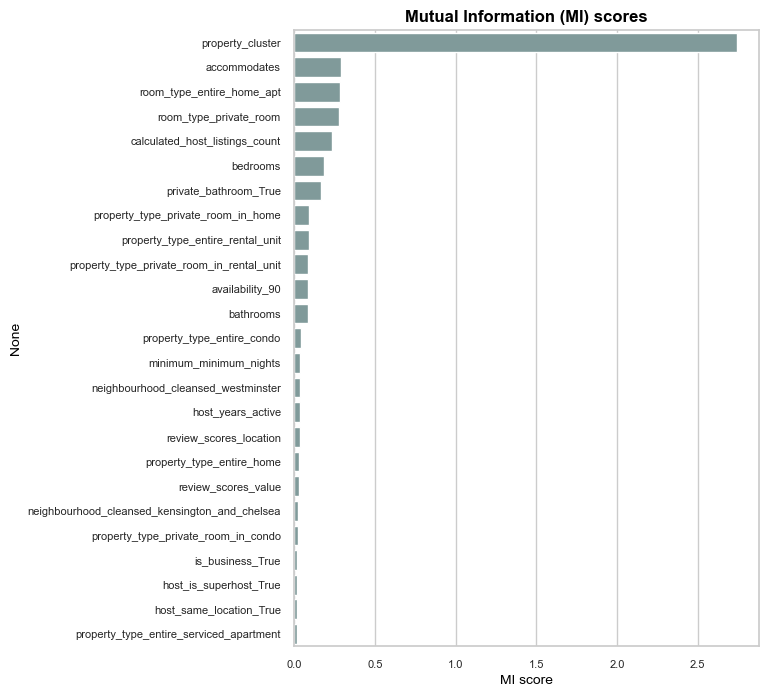

In [60]:
# display Mutual Information scores of the features
mi_score = get_mi_score(X_train_transformed, y_train)

# Show to 25 most important features
topn = 25
plt.figure(figsize=(6, 8))
ax = sns.barplot(y=mi_score.index[:topn], x=mi_score[:topn], color=BASE_COLOR,)
plt.xlabel('MI score')
ax.set_title('Mutual Information (MI) scores')
plt.show()

### Test for multicollinearity using Variance Inflation Factor (VIF)

Multicollinearity means, there are linear relationships or correlation between independent variables, which should not be the case for linear regression to be effective.

Typically, a variable with VIF greater than 5 indicates Multicollinearity.


In [61]:
# gather features
vip_features = " + ".join(X_train_transformed.columns)

In [62]:
# merge X and y as required by statsmodels
vip_df = X_train_transformed.merge(y_train, left_index=True, right_index=True)

In [63]:
sm_y, sm_X = dmatrices('price_mean ~' + vip_features,
                       vip_df,
                       return_type='dataframe')
vif = pd.DataFrame()
vif['VIF Factor'] = \
    [variance_inflation_factor(sm_X.values, i) for i in range(sm_X.shape[1])]
vif['features'] = sm_X.columns
vif

/opt/anaconda3/envs/ds_udacity_projects/lib/python3.10/site-packages/statsmodels/stats/outliers_influence.py:198: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


,VIF Factor,features
0,inf,Intercept
1,3.200951,accommodates
2,3.059218,bedrooms
3,1.555948,bathrooms
4,1.037160,minimum_minimum_nights
5,1.293153,calculated_host_listings_count
6,1.165231,host_years_active
7,1.282211,availability_90
8,1.800859,review_scores_location
9,1.816388,review_scores_value


>**Observation:** 
> - For VIF to be 'inf' means R2 must be 1. As the formula 1/1-R2, we end up dividing by 0, ending up with 'inf' values. It means we have high multicollinearity.
> - Lots of interactions between neighborhood and room type exist, ideally we should drop 1 of these variables. But as we are using ridge algorithm, lets observe how regularization can take care of this problem.
> - As `accommodates`, `bedrooms` and `bathrooms` have VIP below 5, I assume it's ok to keep all 3 variables, even though they have some correlation.

### Plot model performance

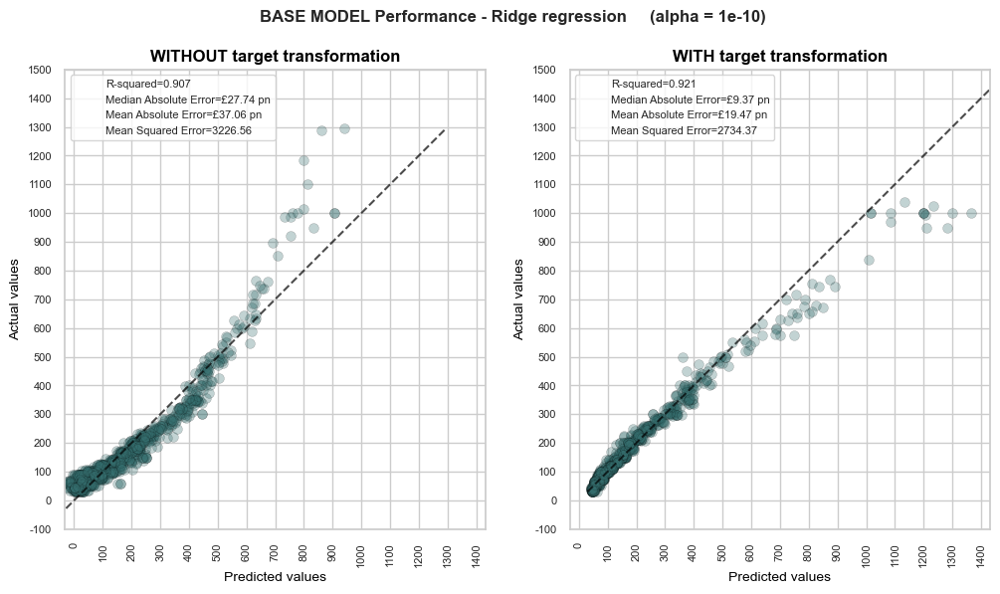

In [64]:
text = 'BASE MODEL Performance - Ridge regression \
    (alpha = {})'.format(alpha_base)

vs.plot_model_performance_scatter(
    y_train,
    y_train_preds,
    y_train_preds_transformed,
    title1='WITHOUT target transformation',
    title2='WITH target transformation',
    suptitle=text,
    kind='actual_vs_predicted',
    lower_lim=-100,
    upper_lim=1500,
    interval=100,
)

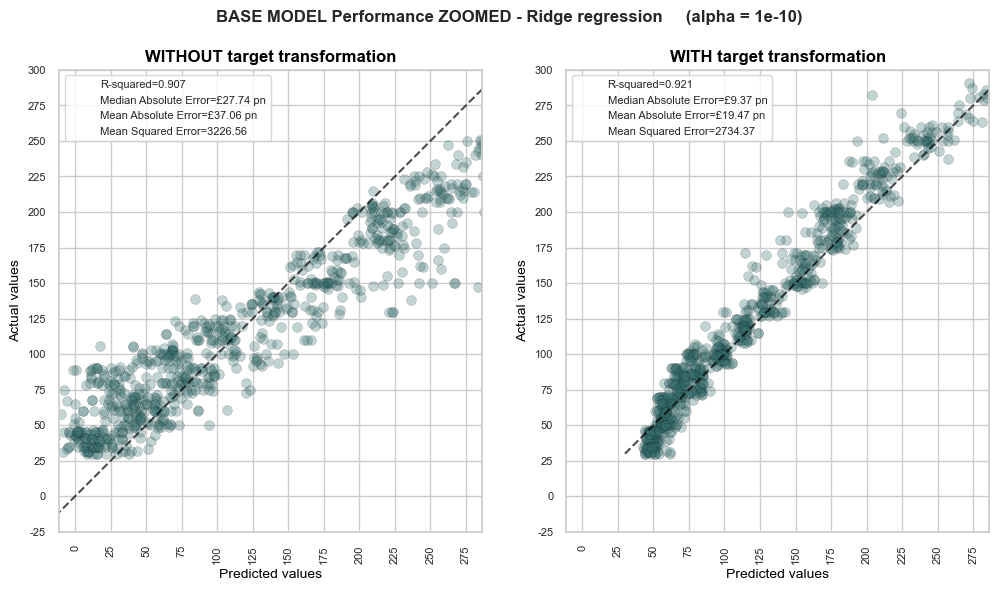

In [65]:
# Lets zoom a bit to the most likely price range,
# filtering the luxury listings out

text = 'BASE MODEL Performance ZOOMED - Ridge regression \
    (alpha = {})'.format(alpha_base)

vs.plot_model_performance_scatter(
    y_train,
    y_train_preds,
    y_train_preds_transformed,
    title1='WITHOUT target transformation',
    title2='WITH target transformation',
    suptitle=text,
    kind='actual_vs_predicted',
    lower_lim=-25,
    upper_lim=300,
    interval=25,
)

>**Observation:**
>   - Model without log transformation, are frequently under-predicting, and even comes up with negative price predictions. Overall prediction are better, which is quite strange ??!!
>   - Model with log transformation are doing excellent with most likely predictions between £100 - £500, but overpredict outlier budget listings below £75 and luxury listings over £500 which gives it poorer overall scores

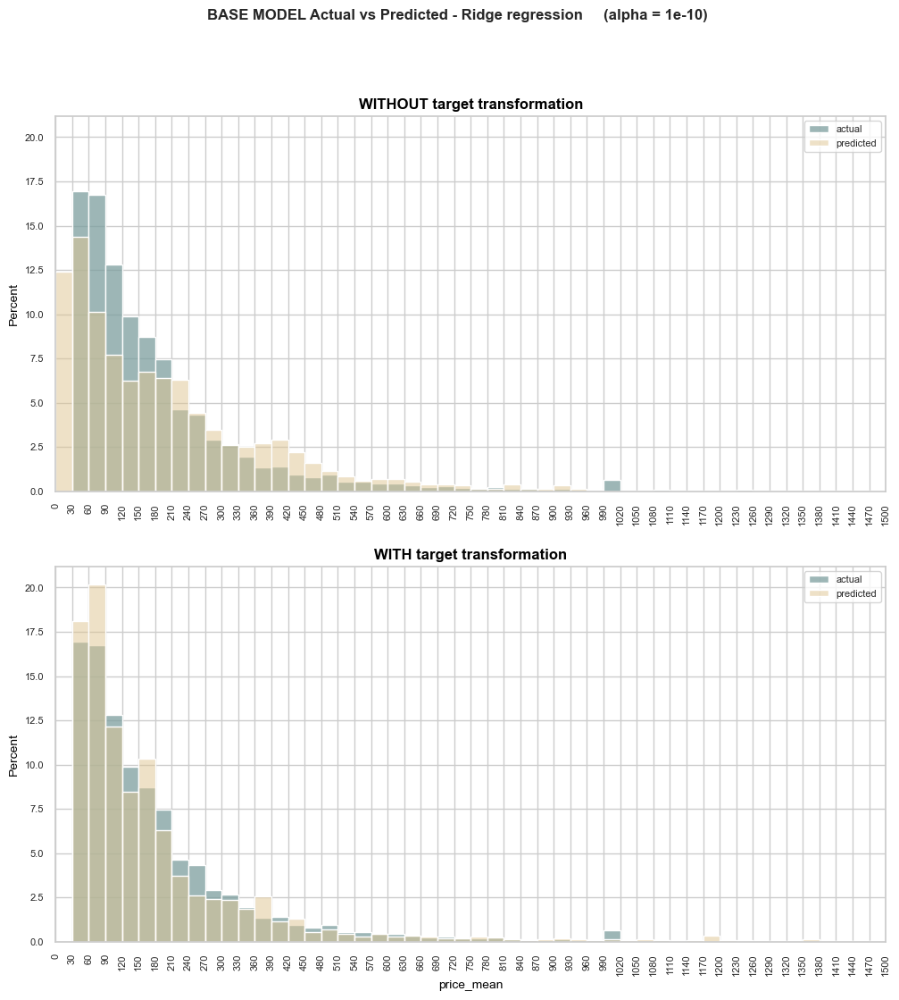

In [66]:
vs.plot_model_performance_hist(
    y_train,
    y_train_preds,
    y_train_preds_transformed,
    title1='WITHOUT target transformation',
    title2='WITH target transformation',
    suptitle='BASE MODEL Actual vs Predicted - Ridge regression \
    (alpha = {})'.format(alpha_base),
    xlim_max=1500,
    xlim_interval=30,
)

>**Observation:** Log transformed model shows a better prediction exponential shape. Overall the model is doing great, but over fit on budget listings below £75

### Linear Assumption Test: Normal distribution of residuals

Residuals should have a constant variance, with a mean around 0

/opt/anaconda3/envs/ds_udacity_projects/lib/python3.10/site-packages/statsmodels/stats/_adnorm.py:67: RuntimeWarning: divide by zero encountered in log1p
  s = np.sum((2 * i[sl1] - 1.0) / nobs * (np.log(z) + np.log1p(-z[sl2])),


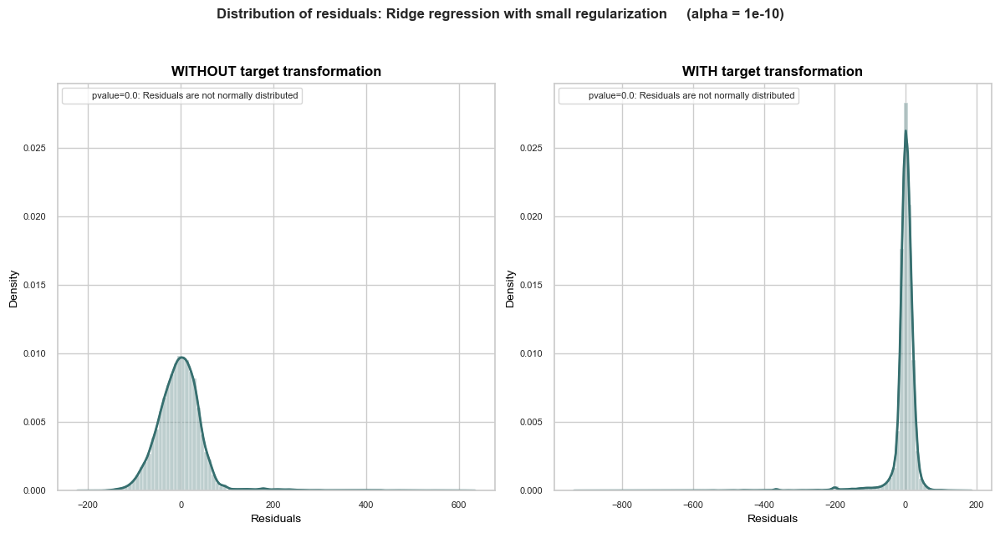

In [67]:
text = 'Distribution of residuals: Ridge regression with small regularization \
    (alpha = {})'.format(alpha_base)

vs.distribution_of_errors(
    model1=base_model,
    model2=base_model_with_log_target,
    X=X_train,
    y=y_train,
    kind='kde',
    title1='WITHOUT target transformation',
    title2='WITH target transformation',
    suptitle=text
)

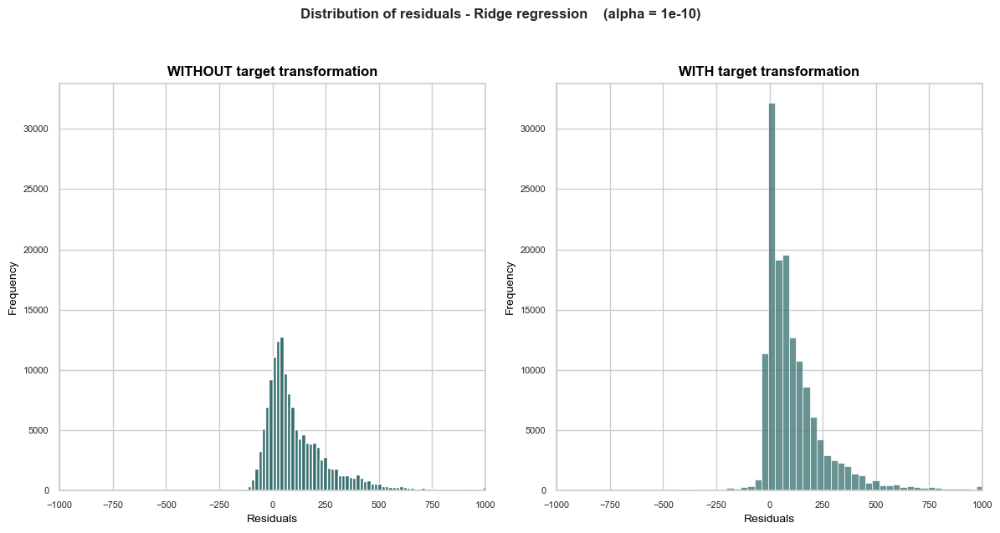

In [68]:
text = 'Distribution of residuals - Ridge regression \
   (alpha = {})'.format(alpha_base)

vs.distribution_of_errors(
    model1=base_model,
    model2=base_model_with_log_target,
    X=X_train,
    y=y_train,
    kind='hist',
    title1='WITHOUT target transformation',
    title2='WITH target transformation',
    suptitle=text
)

>**Observation:** Log transformed model shows a bigger density around mean = 0, which is great, however the error range between 250 and -250 is bigger

### Linear Assumption Test: Homoscedasticity 

Residuals should have a constant variance, with a mean around 0

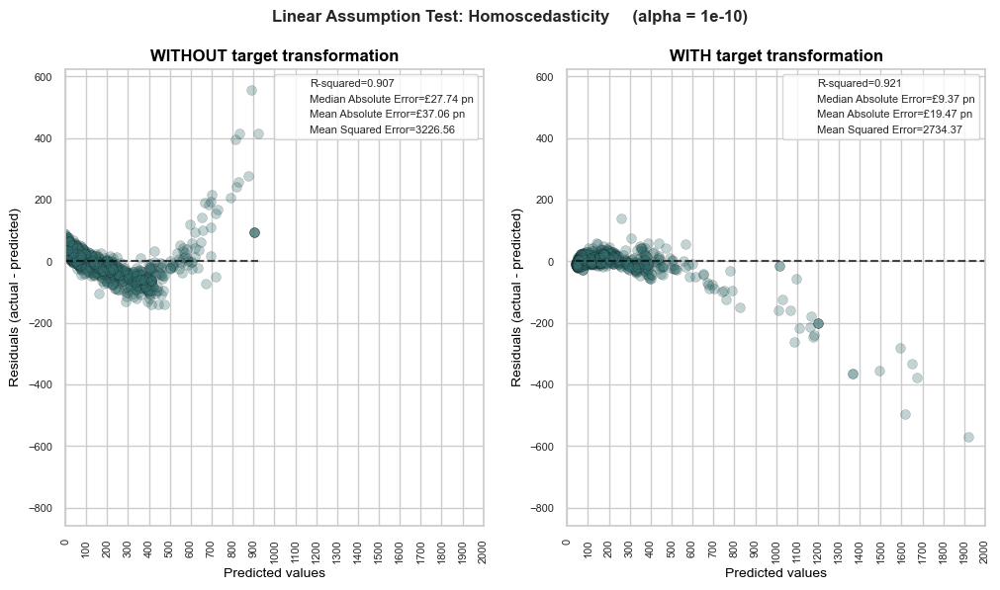

In [69]:
# Assumption #3: Homoscedasticity - residuals have a constant variance
text = 'Linear Assumption Test: Homoscedasticity \
    (alpha = {})'.format(alpha_base)

vs.plot_model_performance_scatter(
    y_train,
    y_train_preds,
    y_train_preds_transformed,
    title1='WITHOUT target transformation',
    title2='WITH target transformation',
    suptitle=text,
    kind='residual_vs_predicted',
    lower_lim=0,
    upper_lim=2000,
    interval=100,
)

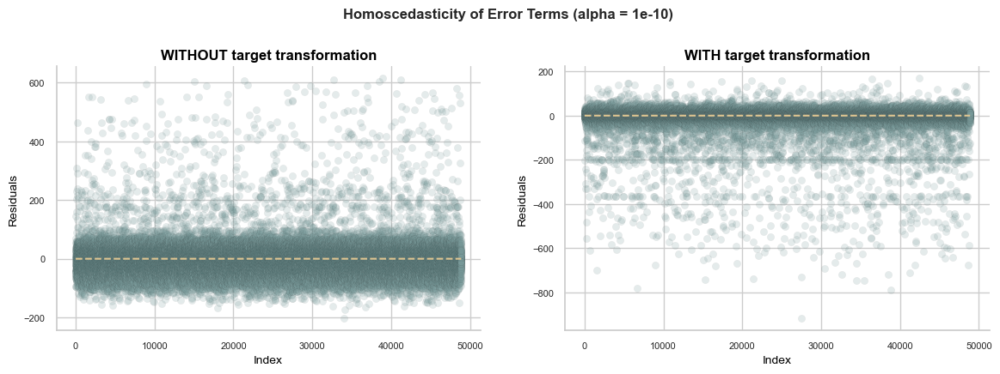

In [70]:
text = 'Homoscedasticity of Error Terms (alpha = {})'.format(alpha_base)
vs.residual_variance(
    model1=base_model,
    model2=base_model_with_log_target,
    X=X_train,
    y=y_train,
    title1='WITHOUT target transformation',
    title2='WITH target transformation',
    suptitle=text,
    figsize=(14, 4),
)

>**Observation:** Both models have a constant variance for most listings, however there are in both cases some outliers. The variance is bigger where the model was log transformed

### Inspect Model Coefficients

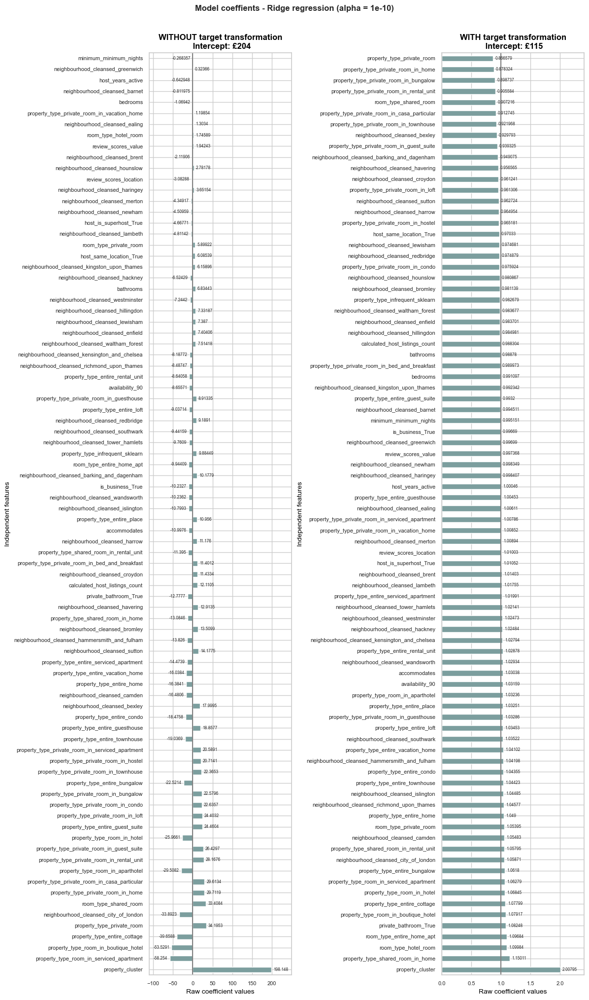

In [71]:
text = 'Model coeffients - Ridge regression (alpha = {})'.format(alpha_base)
coef = vs.plot_coef(
    model1=base_model,
    model2=base_model_with_log_target,
    title1='WITHOUT target transformation',
    title2='WITH target transformation',
    suptitle=text,
    figsize=(12, 20),
    logscale1=False,
    logscale2=True,
)

The plot above tells us about dependencies between a specific feature and
the target when all other features remain constant, i.e., **conditional
dependencies**. 

Without log scale conversion, these coefficients represent actual pounds increase or decrease in price.

On log scale, these coefficients represent the % increase or decrease in price.
- For example 1.22 means a 22% increase in price for every 1 unit increase in that variable of all other variables stay constant.
- For example 0.8 means actually a 20% **decrease** in price for every 1 unit increase in that variable of all other variables stay constant.

<div class="alert alert-danger"><h4>Warning</h4>
<p>
Coeffients for model without log transformation makes little since. Intercept is high +/- £200 per night. 
An increase of ENTIRE HOMES will induce a decrease of the PRICE when all other features remain constant. 
On the contrary, an increase of the SHARED ROOMS will induce an increase of the PRICE when all other features remain constant.
This contradicts what we saw in exploratory analysis above.
    
</p></div>

Coefficients for model with log transformation looks better. Intercept seems reasonable at around £115. We have some strange coefficients signs here as well. Example shared room in house would be expected to have coefficient value below 1.

### Variability of the coefficients

We can check the coefficient variability through cross-validation:
it is a form of data perturbation (related to
[resampling](https://en.wikipedia.org/wiki/Resampling_(statistics))).

If coefficients vary significantly when changing the input dataset
their robustness is not guaranteed, and they should probably be interpreted
with caution.

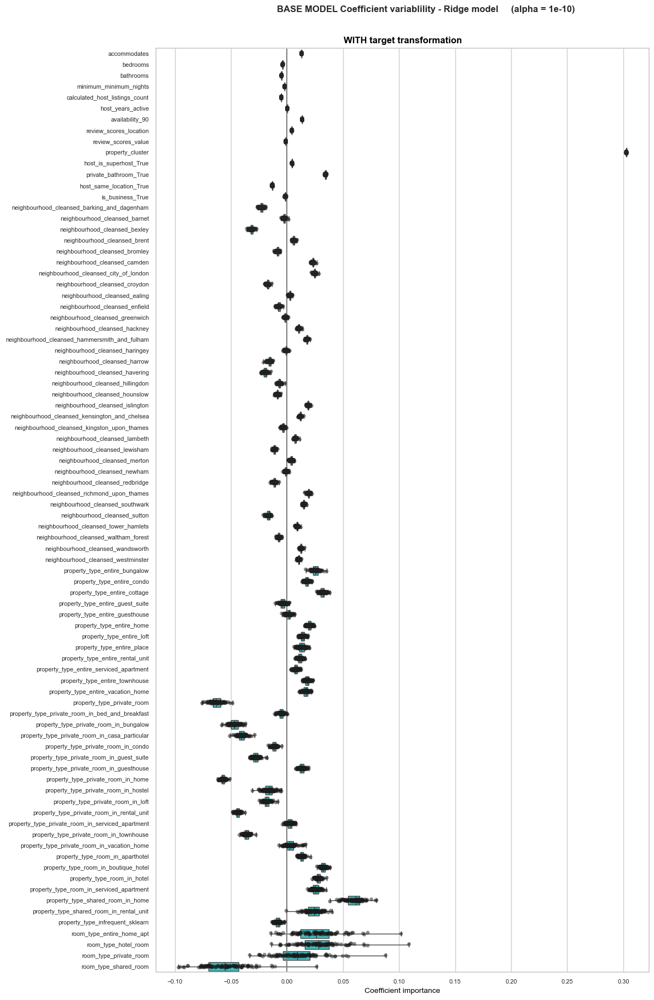

In [72]:
text = 'BASE MODEL Coefficient variablility - Ridge model \
    (alpha = {})'.format(alpha_base)

cv_results_base_log = vs.coefficient_variability(
    model=base_model_with_log_target,
    X=X_train,
    y=y_train,
    splits=10,
    repeats=10,
    jobs=-1,
    scoring=('r2', 'neg_mean_squared_error'),
    figsize=(12, 18),
    title='WITH target transformation',
    suptitle=text,
    random_state=random_state
)

In [73]:
# Print average scores during cross validation
print('Avg MSE score: {} with std {}'.format(
    cv_results_base_log['test_neg_mean_squared_error'].mean(),
    cv_results_base_log['test_neg_mean_squared_error'].std()))

print('Avg R2: {} with std {}'.format(
    cv_results_base_log['test_r2'].mean(),
    cv_results_base_log['test_r2'].std()))

Avg MSE score: -2741.7678103822063 with std 242.3693655926176
Avg R2: 0.921277383225835 with std 0.0060452785002145445


>**Observation**: We can observe high variability in room_type, and some minor variability in some neighbourhoods 

### QQ plot (short for Quantile-Quantile)

As the name suggests, it depicts the quantiles of the observed distribution (residuals in this case) against the quantiles of a reference distribution, typically the standard normal distribution.

- We plot the quantiles of the two distributions against each other.
- Deviations from the straight line indicate a departure from the assumed distribution.


**A good QQ plot will:**

Show minimal deviations from the reference line, indicating that the residuals are approximately normally distributed.

**A bad QQ plot will:**

Exhibit significant deviations, indicating a departure from the normality of residuals.
Display patterns of skewness with its diverging ends, etc.

Thus, the more aligned the QQ plot looks, the more confident you can be about your model.

This is especially useful when the regression line is difficult to visualize, i.e., in a high-dimensional dataset.

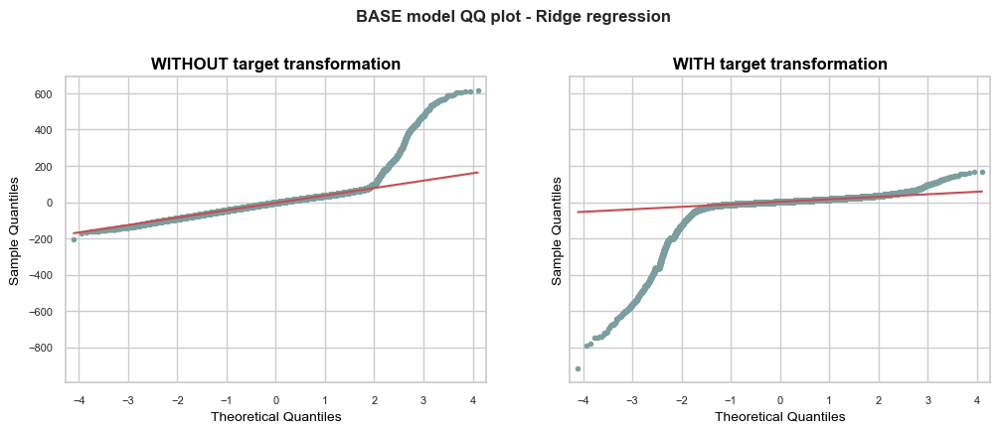

In [74]:
# QQ plot
vs.compare_qqplot(
    base_model,
    base_model_with_log_target,
    X_train,
    y_train,
    title1='WITHOUT target transformation',
    title2='WITH target transformation',
    suptitle='BASE model QQ plot - Ridge regression',
    figsize=(12, 4)
)

<a id='ridgecv'></a>
<span style="color:blue; font-size:30px; line-height:40px; font-family: Calibri;">Modelling Step 2 - Using RidgeCV</span>

Let's get rid of interactions, by increasing regularization

In [75]:
cv = KFold(n_splits=10, shuffle=True)

# manually set alpha quite high to see the effect.
alphas = (3000, 4000, 5000)

ridgecv = Pipeline(
    [
        ("preprocess", preprocessor),
        ('selector', VarianceThreshold(0)),
        ("regressor", TransformedTargetRegressor(
            regressor=RidgeCV(alphas=alphas,
                              scoring='neg_mean_squared_error',
                              cv=cv),
            func=log_transform,
            inverse_func=inverse_log_transform)),
    ]
)

ridgecv.fit(X_train, y_train).set_output(transform="pandas")

Pipeline(steps=[('preprocess',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('number',
                                                  Pipeline(steps=[('impute',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scale',
                                                                   StandardScaler())]),
                                                  ['accommodates', 'bedrooms',
                                                   'bathrooms',
                                                   'minimum_minimum_nights',
                                                   'calculated_host_listings_count',
                                                   'host_years_active',
                                                   'availability_90',
                                                   'review_scores_location',
                                                   'revi...
                                   verbose_feature_names_out=False)),
                ('selector', VarianceThreshold(threshold=0)),
                ('regressor',
                 TransformedTargetRegressor(func=<function log_transform at 0x7fd50ccd51b0>,
                                            inverse_func=<function inverse_log_transform at 0x7fd50ccd5240>,
                                            regressor=RidgeCV(alphas=(3000,
                                                                      4000,
                                                                      5000),
                                                              cv=KFold(n_splits=10, random_state=None, shuffle=True),
                                                              scoring='neg_mean_squared_error')))])

First we check which value of $\alpha$ has been selected.

In [76]:
alpha_ridgecv = ridgecv.named_steps.regressor.regressor_.alpha_
print('alpha chosen: {}'.format(alpha_ridgecv))

alpha chosen: 3000


In [77]:
# Best R2 score during fitting
print('Best R2 score during fitting: {}'.format(
    ridgecv.named_steps.regressor.regressor_.best_score_))

Best R2 score during fitting: -0.00462283269747446


## Evaluation: RidgeCV

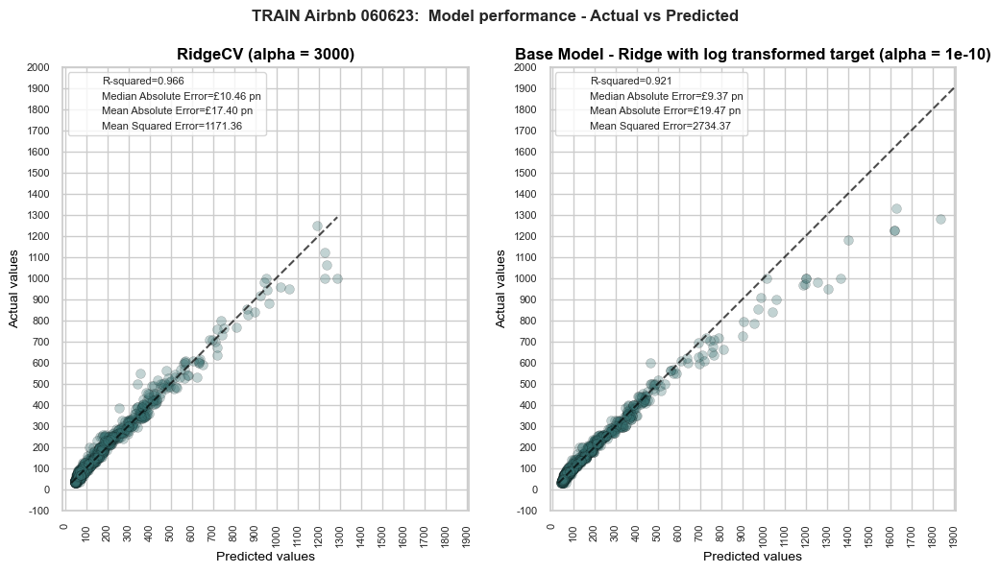

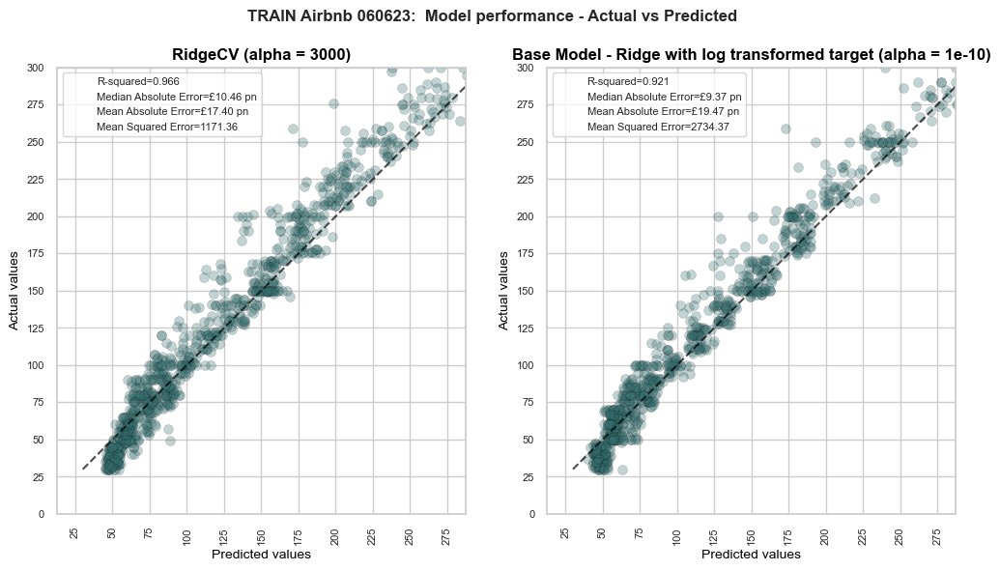

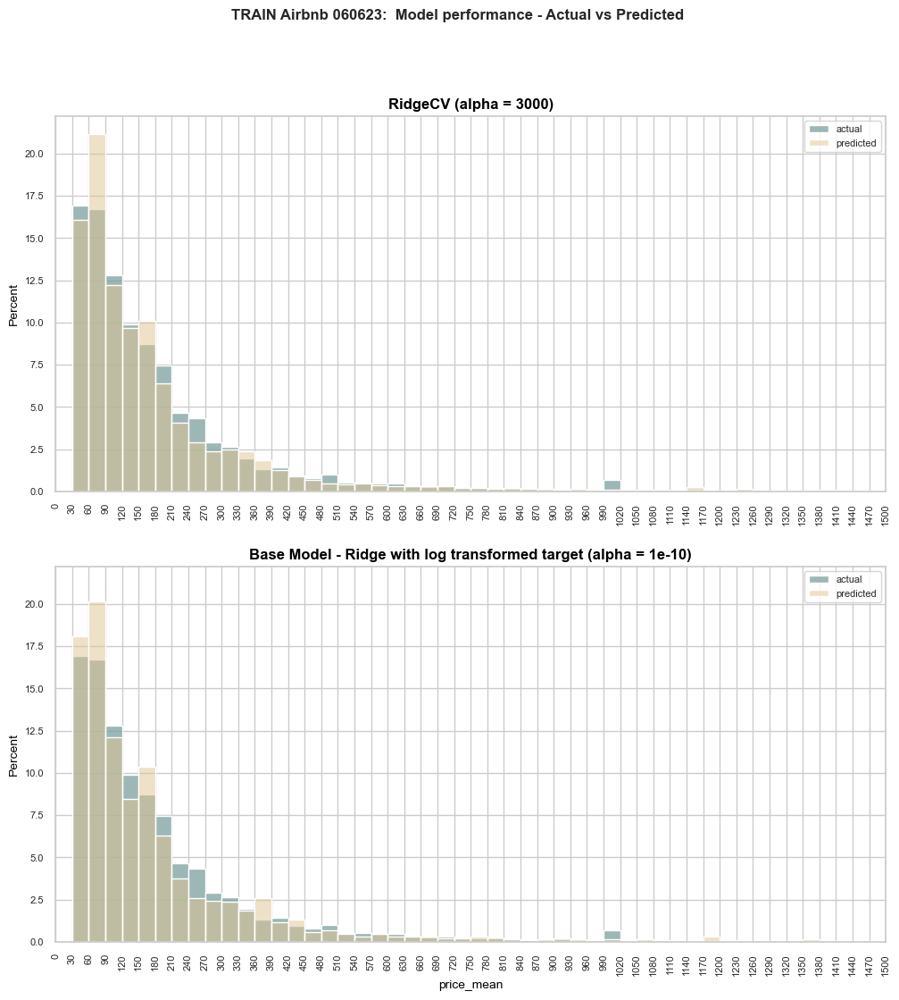

/opt/anaconda3/envs/ds_udacity_projects/lib/python3.10/site-packages/statsmodels/stats/_adnorm.py:67: RuntimeWarning: divide by zero encountered in log1p
  s = np.sum((2 * i[sl1] - 1.0) / nobs * (np.log(z) + np.log1p(-z[sl2])),


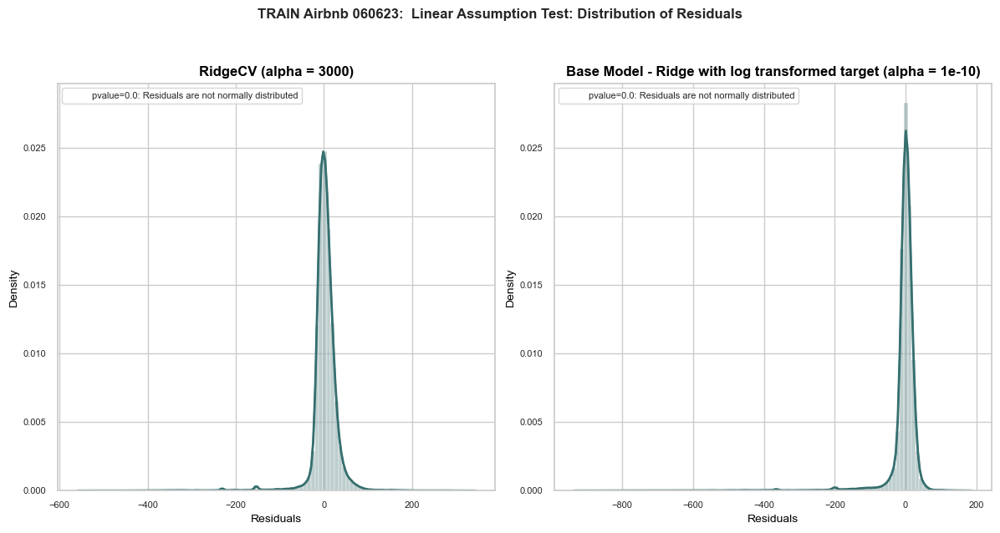

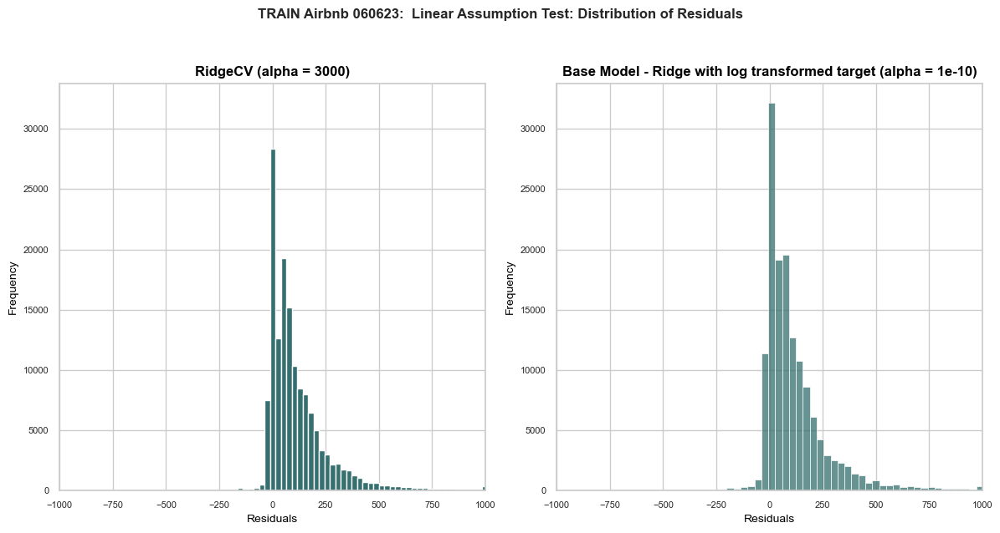

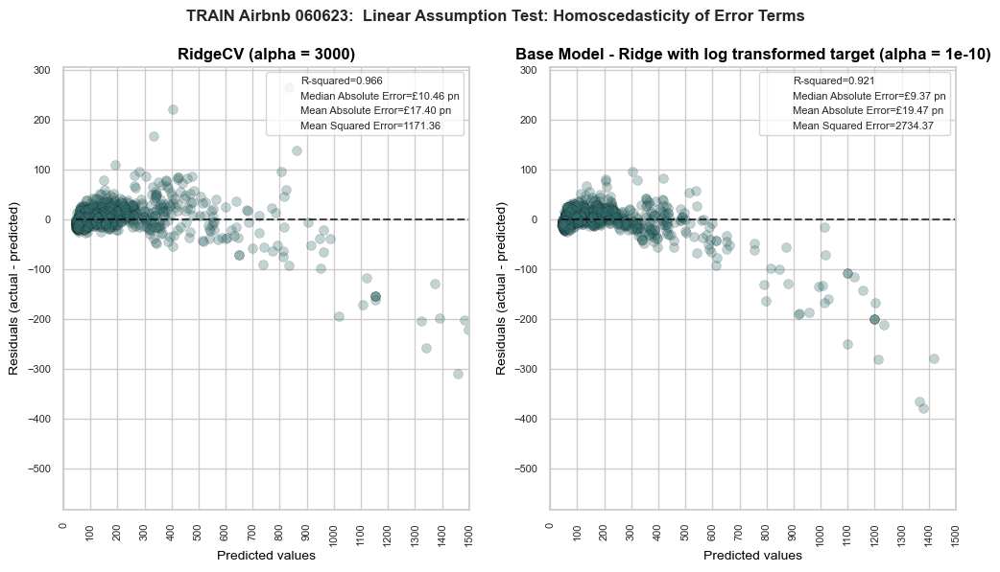

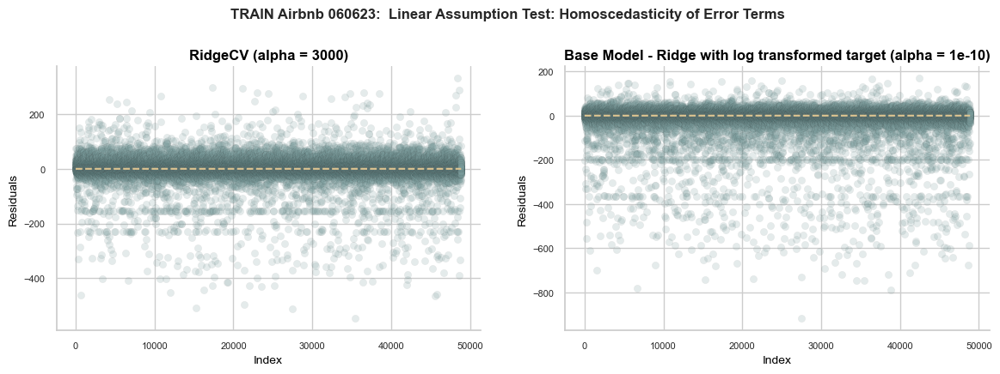

In [78]:
vs.model_evaluation(
    model1=ridgecv,
    model2=base_model_with_log_target,
    X=X_train,
    y=y_train,
    alpha1=alpha_ridgecv,
    alpha2=alpha_base,
    title1='RidgeCV',
    title2='Base Model - Ridge with log transformed target',
    suptitle='TRAIN Airbnb {}: '.format(date_stamp)
)

### Inspect Model Coefficients

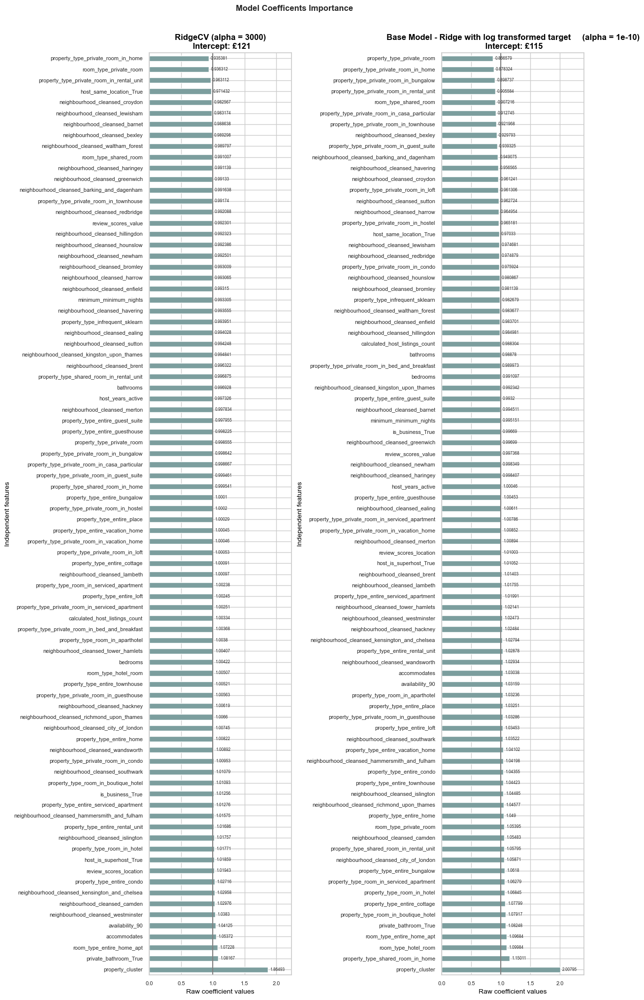

In [79]:
# on log scale, %
text = 'Base Model - Ridge with log transformed target \
    (alpha = {})'.format(alpha_base)
coef = vs.plot_coef(
    model1=ridgecv,
    model2=base_model_with_log_target,
    title1='RidgeCV' + ' (alpha = {})'.format(alpha_ridgecv),
    title2=text,
    suptitle='Model Coefficents Importance',
    logscale1=True,
    logscale2=True,
    figsize=(12, 20),
)

**Observations:**

On log scale, the coefficients contain the % increase in price, of all other variables stay constant.
For example private_bathroom_True with of 1.082484 means for each increase in bathroom, price will go up by 8.24% if all other variables stay constant

Explanation how to interpret coefficients from Udacity mentor, I hope I got it right!

**Intercept on Original Scale:** The intercept value in your regression model is 2.12. When this is converted back to the original scale of the average price, it becomes approximately 130.83. This implies that if all other predictor variables are set to zero, the base predicted average price per day would be around £130.83.

**Multiplier for accommodates Coefficient:** The coefficient for the variable accommodates in your model is 0.0876. On the logarithmic scale, this coefficient signifies that for each unit increase in the accommodates variable, the log-transformed price is expected to increase by 0.0876. When this is translated back to the original price scale, it means that for each additional person accommodated, the predicted average price is multiplied by approximately 1.22. So, if accommodating one additional person, the price increases by about 22%.

I therefore interpret that these coefficients, when converted back, represent a percentage

### Variability of the coefficients

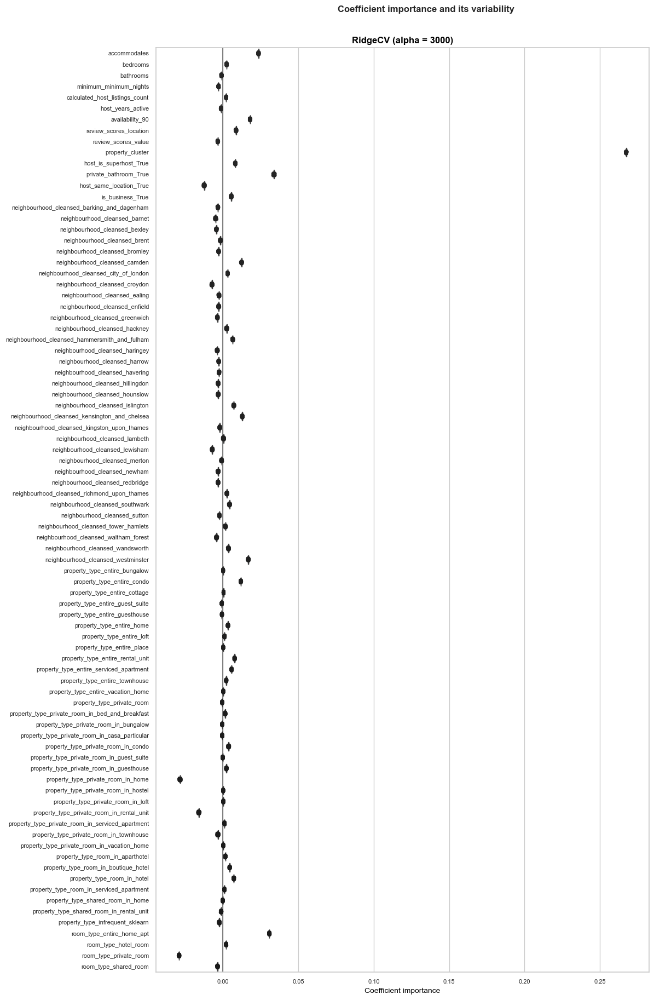

In [80]:
cv_results = vs.coefficient_variability(
    model=ridgecv,
    X=X_train,
    y=y_train,
    splits=10,
    repeats=10,
    jobs=-1,
    scoring=('r2', 'neg_mean_squared_error'),
    figsize=(12, 18),
    title='RidgeCV' + ' (alpha = {})'.format(alpha_ridgecv),
    suptitle='Coefficient importance and its variability',
    random_state=random_state
)

In [81]:
# Print average scores during cross validation
print('Avg MSE score: {} with std {}'.format(
    cv_results['test_neg_mean_squared_error'].mean(),
    cv_results['test_neg_mean_squared_error'].std()))
print('Avg R2: {} with std {}'.format(
    cv_results['test_r2'].mean(), cv_results['test_r2'].std()))

Avg MSE score: -1115.9939799448407 with std 99.04333087136257
Avg R2: 0.9679539751211043 with std 0.002517834192767494


### QQ plot (short for Quantile-Quantile)

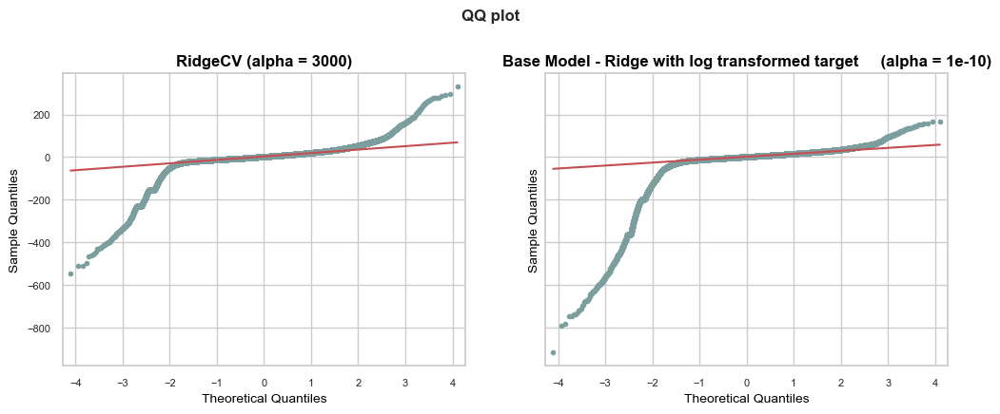

In [82]:
# QQ plot
text = 'Base Model - Ridge with log transformed target \
    (alpha = {})'.format(alpha_base)

vs.compare_qqplot(
    ridgecv,
    base_model_with_log_target,
    X_train,
    y_train,
    title1='RidgeCV' + ' (alpha = {})'.format(alpha_ridgecv),
    title2=text,
    suptitle='QQ plot',
    figsize=(12, 4)
)

<a id='final'></a>
<span style="color:blue; font-size:30px; line-height:40px; font-family: Calibri;">Final TEST Evaluation</span>

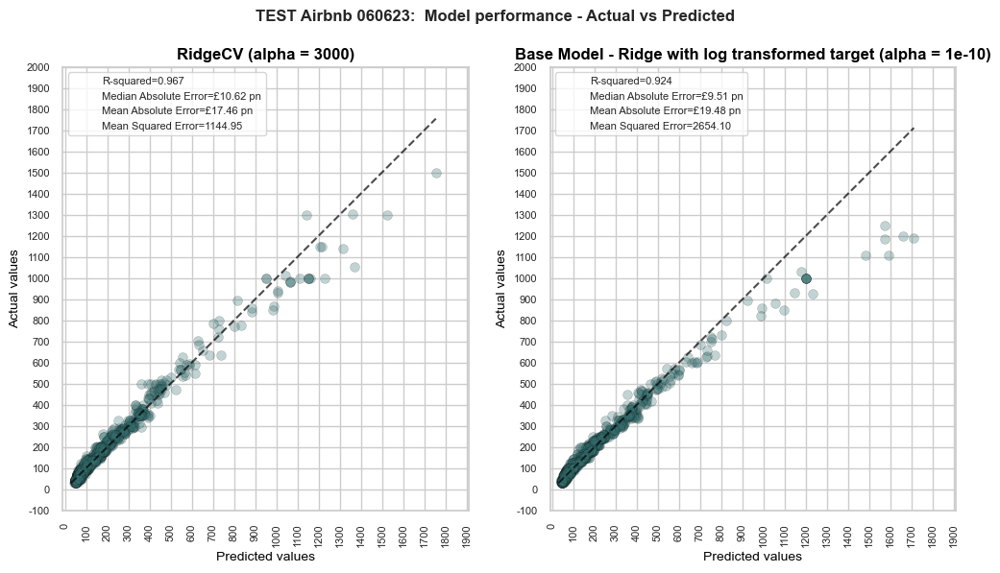

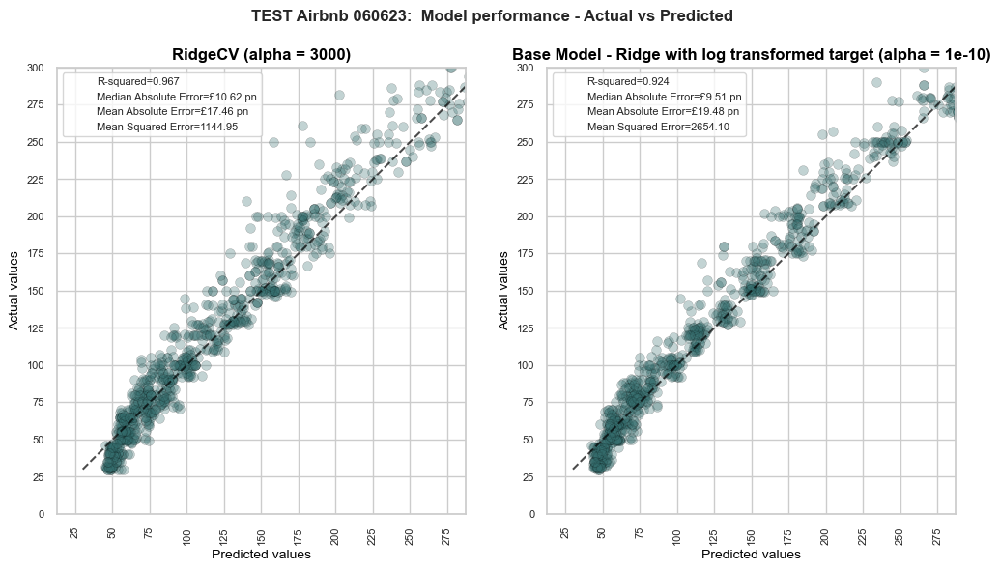

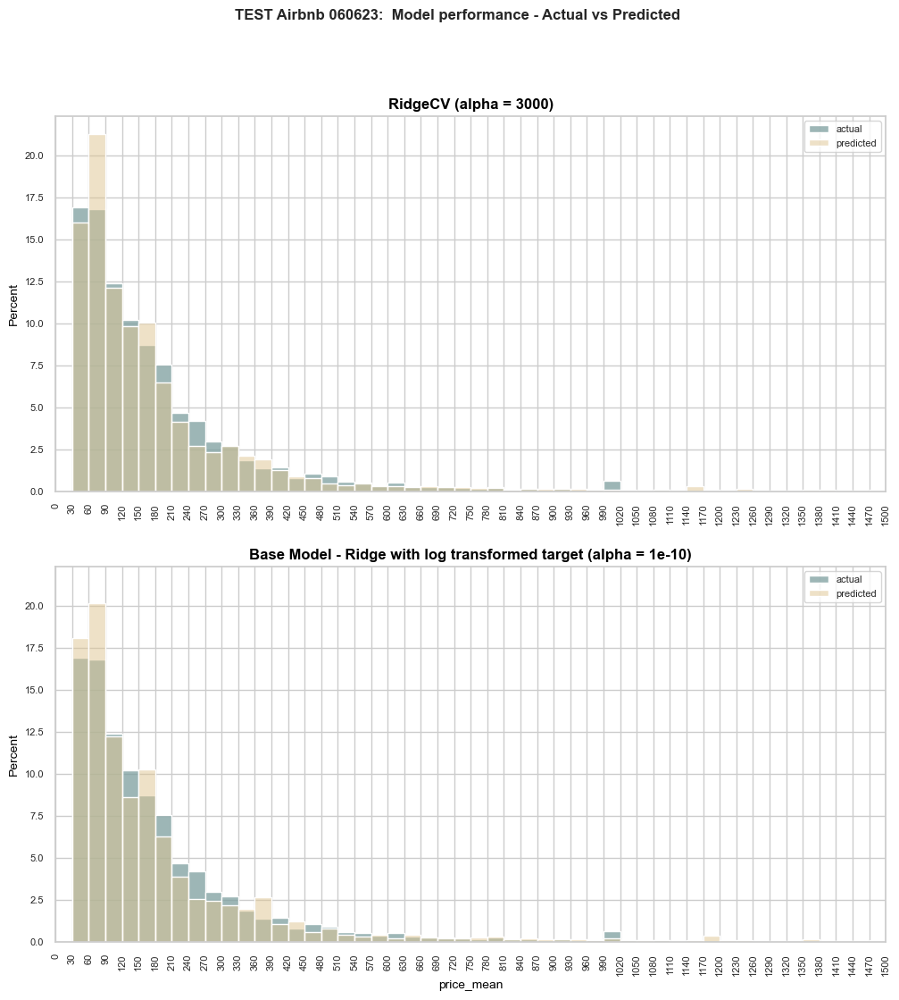

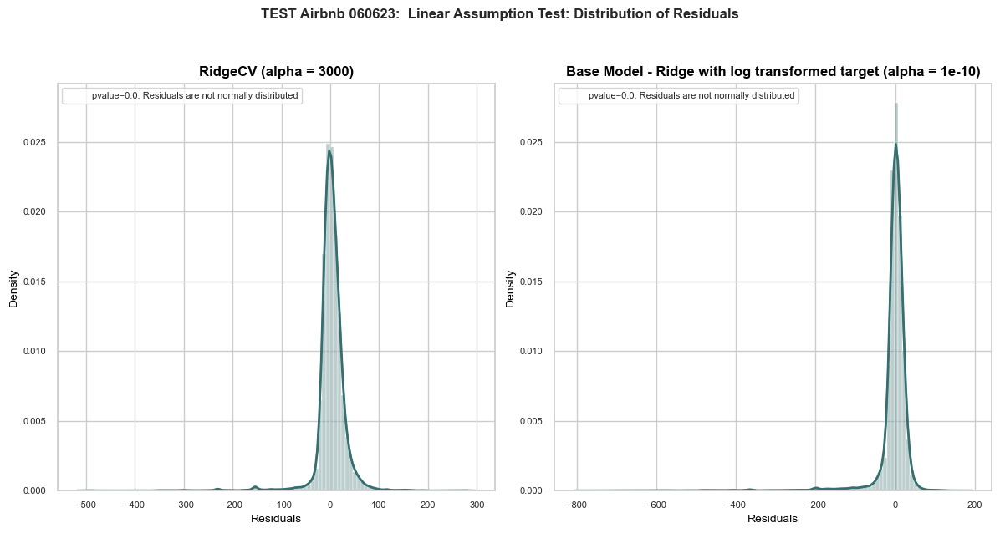

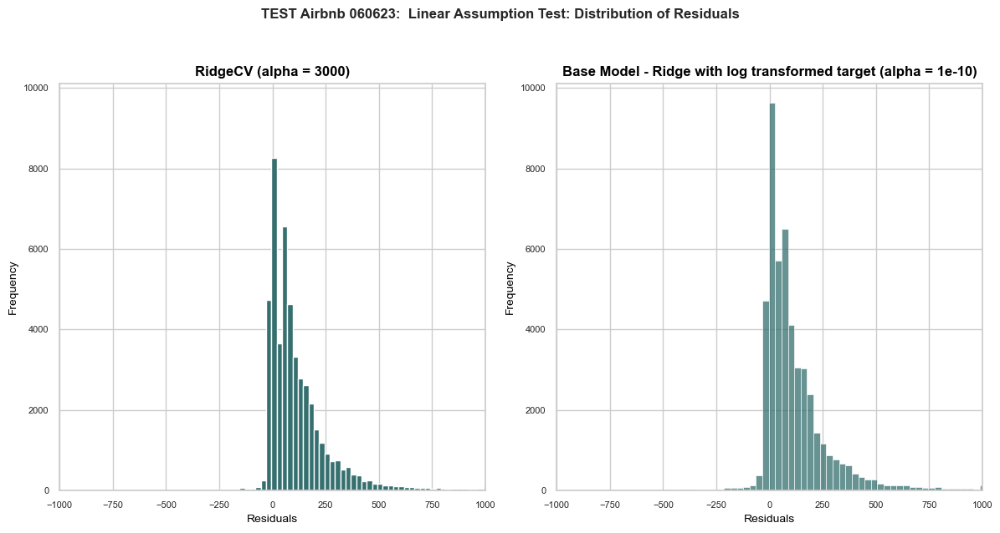

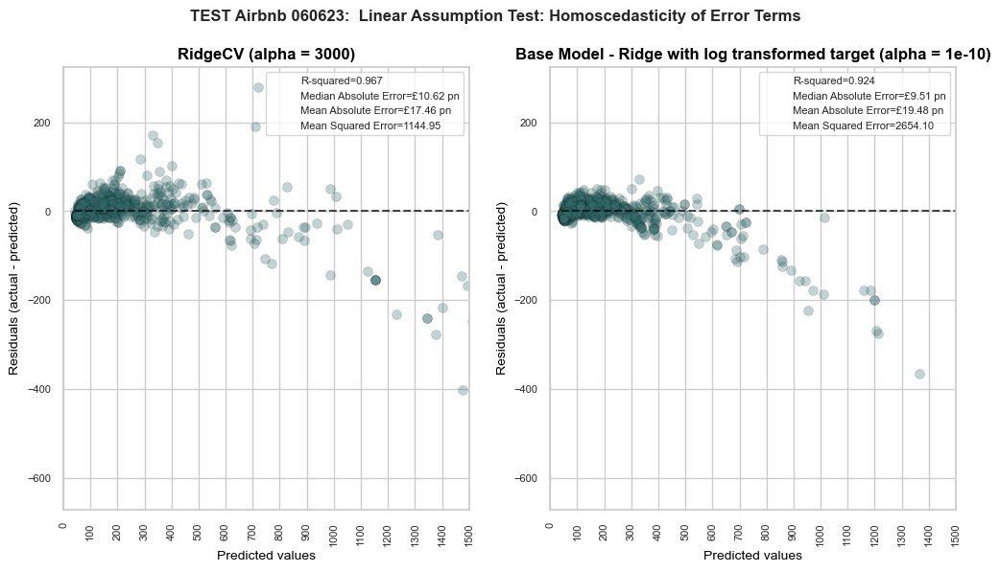

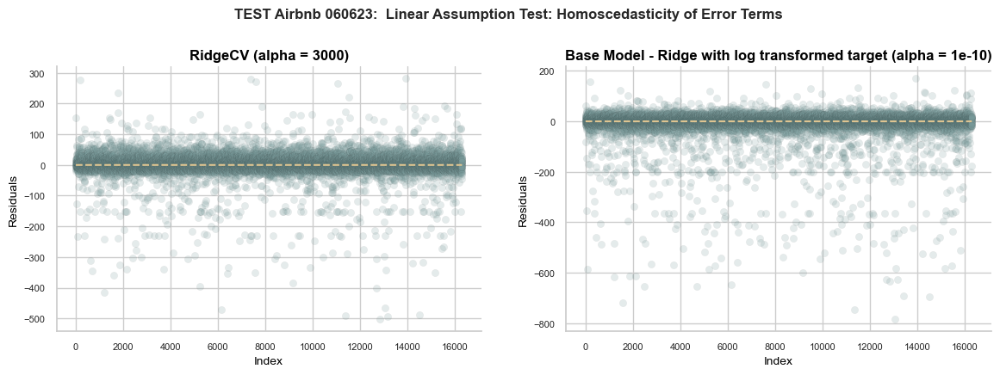

In [83]:
vs.model_evaluation(
    model1=ridgecv,
    model2=base_model_with_log_target,
    X=X_test,
    y=y_test,
    alpha1=alpha_ridgecv,
    alpha2=alpha_base,
    title1='RidgeCV',
    title2='Base Model - Ridge with log transformed target',
    suptitle='TEST Airbnb {}: '.format(date_stamp)
)

In [84]:
# save fitted models
dump(cluster_preprocessor, open(file_cluster_preprocessor, 'wb'))
dump(gmm, open(file_gmm, 'wb'))
dump(onehot_preprocessor, open(file_onehot_preprocessor, 'wb'))

<a id='optional'></a>
<span style="color:blue; font-size:30px; line-height:40px; font-family: Calibri;">Further evaluation with Airbnb 06/09/2023 data (optional)</span>

As an extra step, use the latest Airbnb data released on **06 September 2023** to test the model performance. This data was never seen before during development of this model, we can see how the model generalize on a brand-new dataset! We will be using the already fitted model on June 2023 data.

Notebook 1 and 2 was run manually in sequence by changing the date stamp parameter from 060623 to 090623
A new enhanced file was generated with suffix '_090623' in `data/clean` folder

In [85]:
# read latest airbnb listings file
listing_latest = pd.read_pickle(FILE_NAME_ENHANCED_LATEST)
listing_latest.head(2)

,listing_id,listing_url,name,host_id,host_name,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_neighbourhood,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bedrooms,beds,price,minimum_minimum_nights,minimum_maximum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,host_has_about,host_has_neighborhood_overview,host_years_active,price_mean,private_bathroom,host_same_location,is_business,minimum_night_ranges
0,92644,https://www.airbnb.com/rooms/92644,Rental unit in Earlsfield · ★4.57 · 1 bedroom ...,498201,Dee Dee,NaN,0,100,False,Earlsfield,True,True,Wandsworth,51.44201,-0.18739,Private room in rental unit,Private room,2,1.5,1.0,2.0,42,2,1125,0,0,0,217,216,9,0,2011-06-21,2022-10-29,4.57,4.74,4.86,4.71,4.67,4.53,4.68,NaN,True,1,0,1,0,1.45,True,False,12,42,False,False,False,7
1,93015,https://www.airbnb.com/rooms/93015,Rental unit in Hammersmith · ★4.82 · 2 bedroom...,499704,Sarah,within a few hours,100,25,False,Hammersmith,True,True,Hammersmith and Fulham,51.49993,-0.21707,Entire rental unit,Entire home/apt,5,1.0,2.0,3.0,175,5,240,13,18,38,40,38,2,0,2012-02-01,2022-09-30,4.82,4.76,4.62,4.85,4.88,4.85,4.74,NaN,False,1,1,0,0,0.27,True,True,12,183,True,True,False,7


In [86]:
# for easy troubleshooting, lets make listing_id the index
listing_latest = listing_latest.set_index('listing_id')
listing_latest = listing_latest.loc[:, main_cols]
listing_latest.head(2)

,host_is_superhost,accommodates,bedrooms,bathrooms,minimum_minimum_nights,calculated_host_listings_count,host_years_active,price_mean,private_bathroom,host_same_location,is_business,availability_90,neighbourhood_cleansed,property_type,room_type,review_scores_location,review_scores_value,latitude,longitude
listing_id,,,,,,,,,,,,,,,,,,,
92644,False,2,1.0,1.5,2,1,12,42,False,False,False,0,Wandsworth,Private room in rental unit,Private room,4.53,4.68,51.44201,-0.18739
93015,False,5,2.0,1.0,5,1,12,183,True,True,False,38,Hammersmith and Fulham,Entire rental unit,Entire home/apt,4.85,4.74,51.49993,-0.21707


In [87]:
# load back fited models
cluster_preprocessor = load(open(file_cluster_preprocessor, 'rb'))
gmm = load(open(file_gmm, 'rb'))
onehot_preprocessor = load(open(file_onehot_preprocessor, 'rb'))

In [88]:
# cluster, clean and split data
X_train_060923, X_test_060923, y_train_060923, y_test_060923 = cleaning(
    listing_latest,
    cluster_preprocessor,
    gmm, onehot_preprocessor
)

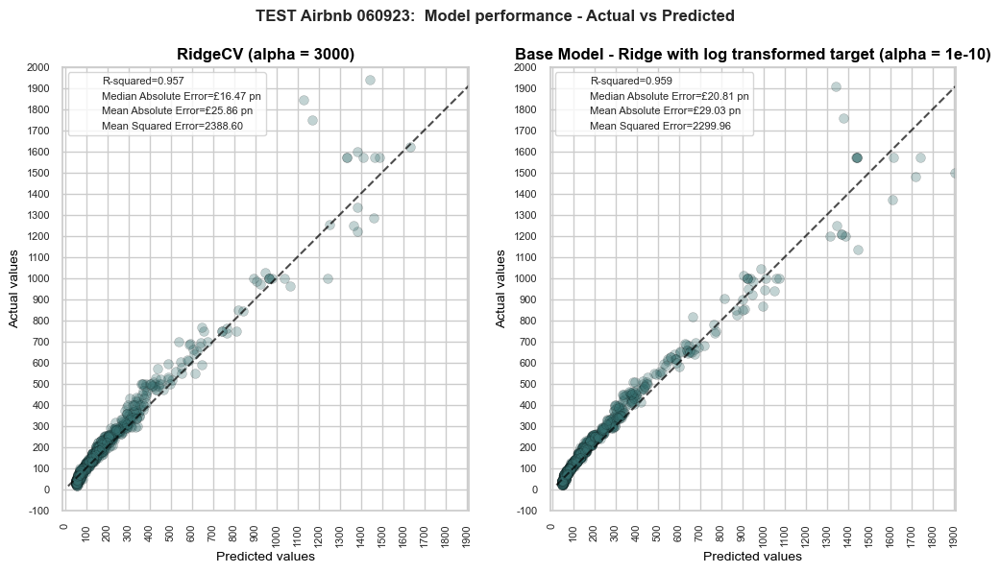

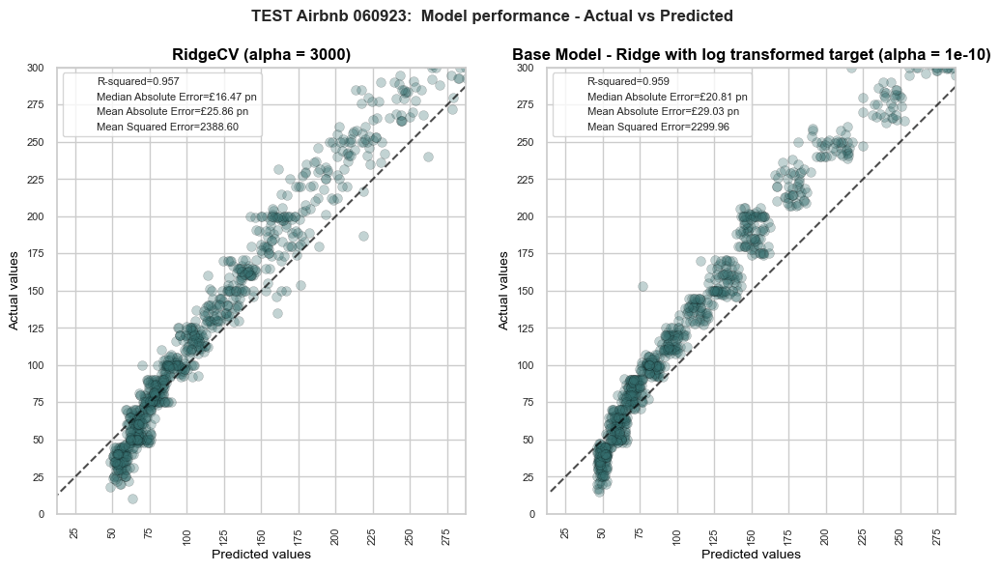

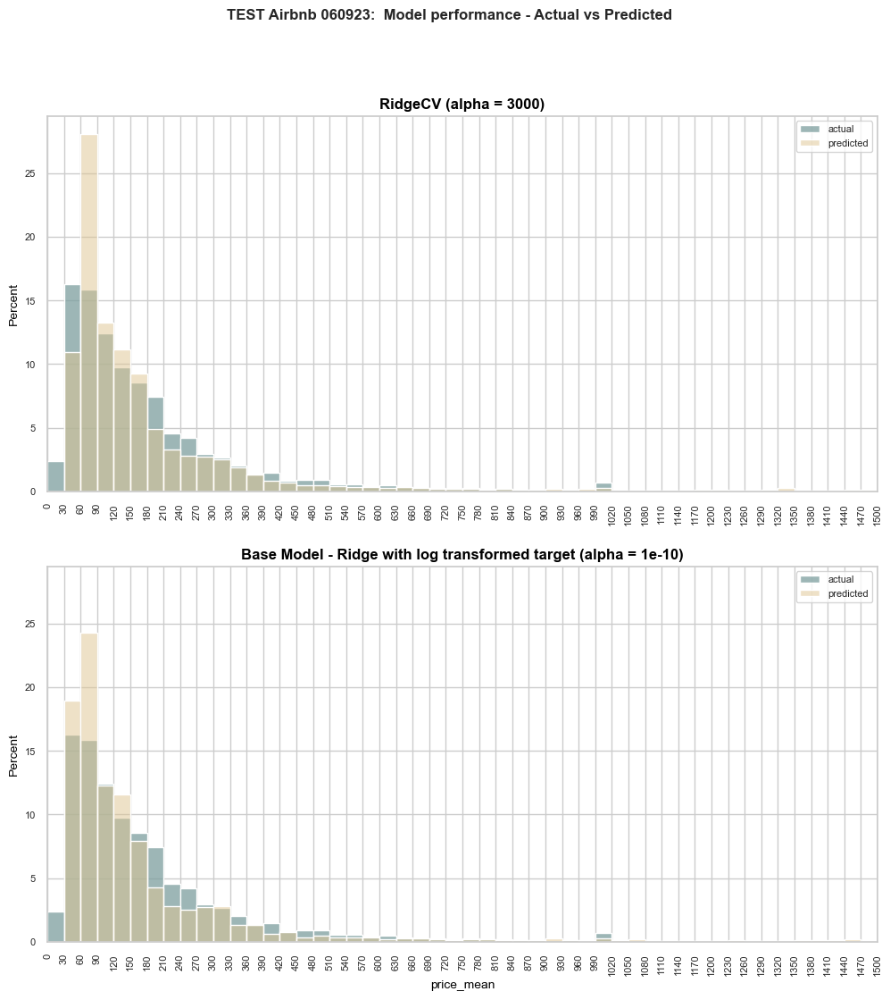

/opt/anaconda3/envs/ds_udacity_projects/lib/python3.10/site-packages/statsmodels/stats/_adnorm.py:67: RuntimeWarning: divide by zero encountered in log1p
  s = np.sum((2 * i[sl1] - 1.0) / nobs * (np.log(z) + np.log1p(-z[sl2])),
/opt/anaconda3/envs/ds_udacity_projects/lib/python3.10/site-packages/statsmodels/stats/_adnorm.py:67: RuntimeWarning: divide by zero encountered in log1p
  s = np.sum((2 * i[sl1] - 1.0) / nobs * (np.log(z) + np.log1p(-z[sl2])),


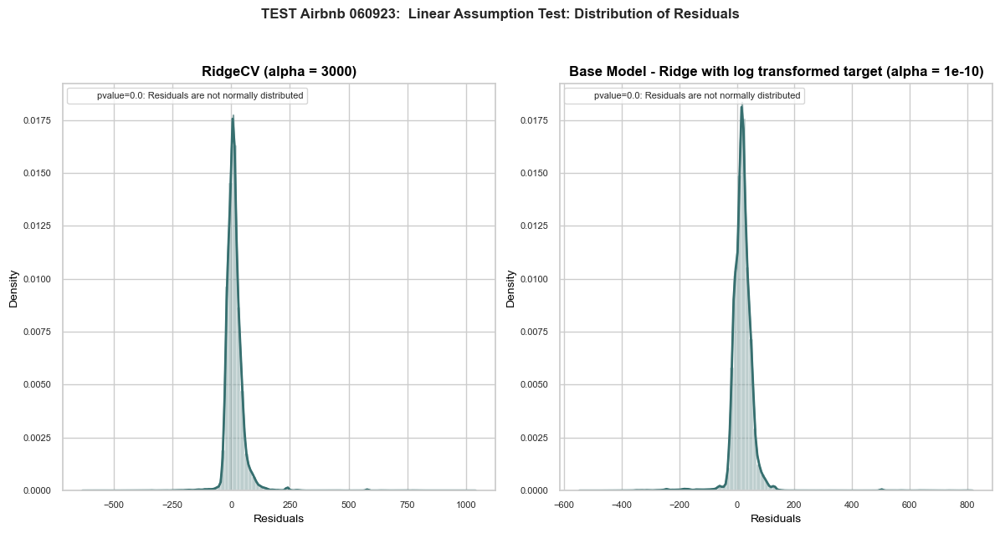

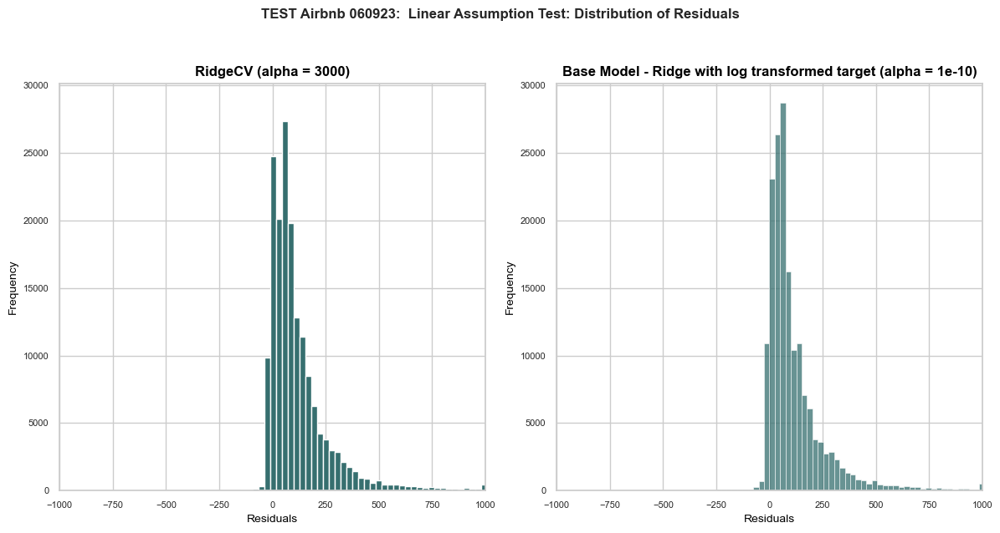

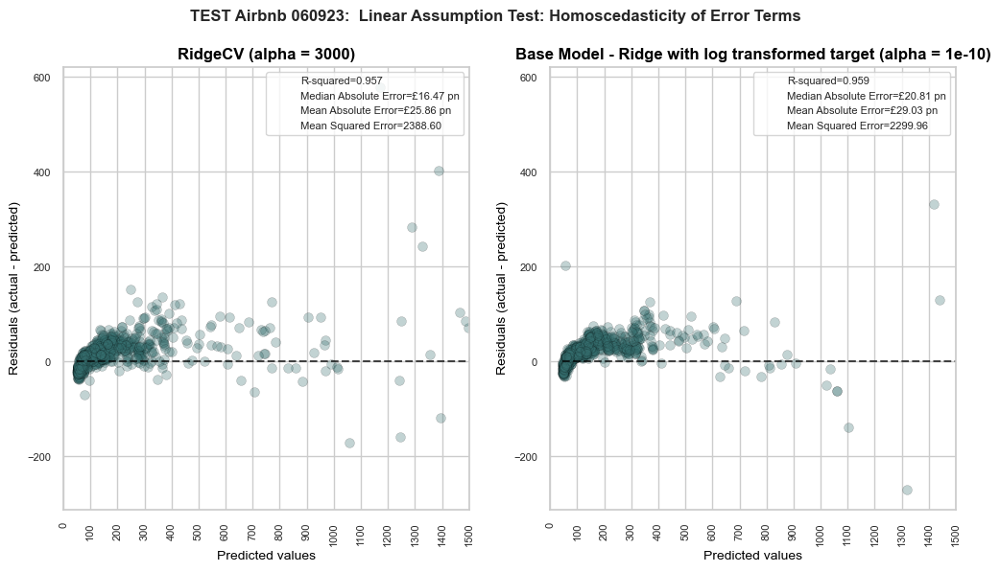

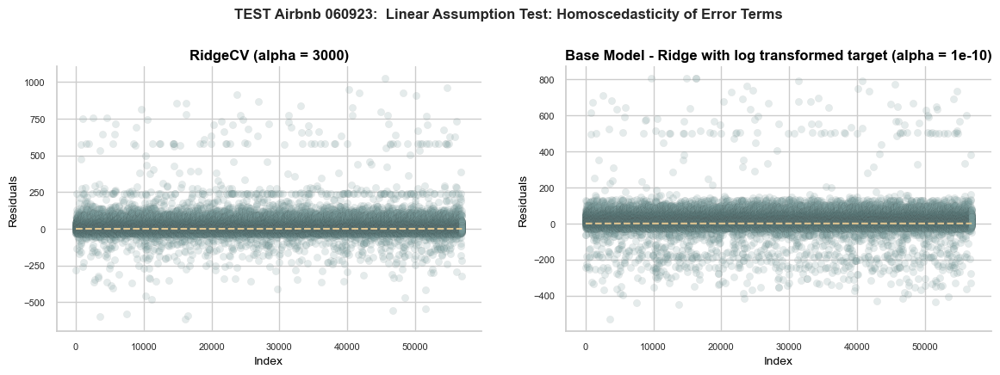

In [89]:
# evaluate latest airbnb file using models trained with June 2023 data
vs.model_evaluation(
    model1=ridgecv,
    model2=base_model_with_log_target,
    X=X_train_060923,
    y=y_train_060923,
    alpha1=alpha_ridgecv,
    alpha2=alpha_base,
    title1='RidgeCV',
    title2='Base Model - Ridge with log transformed target',
    suptitle='TEST Airbnb {}: '.format(date_stamp_latest)
)

<a id='conclusion'></a>
<span style="color:blue; font-size:30px; line-height:40px; font-family: Calibri;">Conclusion</span>

Linear regression modelling was selected as the target variable, as average rental price per night, is a continues variable.
The target variable was converted to a log10 scale to be normally distributed, to meet the linear regression criteria.

A successful linear regression data science model using algorithm **'RidgeCV'** was build to predict prices with a median absolute error of only £11 per night. This means, prices are accurately predicted within a +/- £11 range. R2 score on the test dataset was 0.976, which means the model explains 98% of the variability of the data, which is totally amazing.
RidgeCV was chosen to minimize interactions introduced when adding features neighbourhood, room type and property type. We need a high level regularization with alpha at 3000 to obtain the low level of errors achieved.

To reduce model complexity, property type was summarized through clusterng.
We have over 80 property types, which could make the model after one-hot encoding too complex and cause over fitting. 
We could use room type instead, but this has only 4 categories with so much variation in price, it's too simple for modelling. 
Room type, Property type, location coordinates (latitude, longitude) and price was used to cluster the properties into price groups.

**Gausian mixture model (GMM)** algorithm was used for clustering, as it will look for clusters that have a normal price distribution within each cluster, which will provide a better split.

The average rental price in London does not easily exceed £500, however outliers up to £1500 was kept to observe model behaviour. 
These outliers can be removed for further improvement subsequently.
Generally, the model prediction up to £500 seems excellent if one observe the model performance actual vs predicted, residuals are perfectly linear up to +/£250 

As a last step, the model was evaluated with a new dataset with time stamp 06/09/2023, which became available subsequently. 
Outliers was not removed as during modelling, so the model has to cope with exceptional prices below £30 and above £1500.
Mean absolute error was a little higher at £16 and R2 score was 0.956, still a great result considering outliers was not removed.


<a id='references'></a>
<span style="color:blue; font-size:30px; line-height:40px; font-family: Calibri;">References</span>

- [Common pitfalls in the interpretation of coefficients of linear models](https://scikit-learn.org/stable/auto_examples/inspection/plot_linear_model_coefficient_interpretation.html)
- [Mixed-type imputation for IterativeImputer](https://github.com/scikit-learn/scikit-learn/issues/17087)
- [kaggle feature engineering lesson](https://www.kaggle.com/learn/feature-engineering)
- [boston house prices](https://www.kaggle.com/code/hikmatullahmohammadi/house-price-prediction-eda-step-by-step)
- [linear regression assumptions](https://jeffmacaluso.github.io/post/LinearRegressionAssumptions/)
- [Regularization of linear regression model](https://inria.github.io/scikit-learn-mooc/python_scripts/linear_models_regularization.html)
- [pipeline for multiple predictors](https://scikit-learn.org/stable/auto_examples/ensemble/plot_stack_predictors.html#sphx-glr-auto-examples-ensemble-plot-stack-predictors-py)
- [when to use gamma GLMS](https://stats.stackexchange.com/questions/67547/when-to-use-gamma-glms)
- [feature engineering - clustering with K-means](https://www.kaggle.com/code/ryanholbrook/clustering-with-k-means)
- [using FACETGRID to plot geopandas maps](https://stackoverflow.com/questions/32117579/pandas-plots-on-seaborn-facetgrid?rq=4)
- [QQ plots](https://www.blog.dailydoseofds.com/p/a-visual-and-intuitive-guide-to-qq?utm_source=post-email-title&publication_id=1119889&post_id=138326464&utm_campaign=email-post-title&isFreemail=true&r=25q7g0)
- [Interpreting skew and kurtosis](https://medium.com/@atanudan/kurtosis-skew-function-in-pandas-aa63d72e20de)

<a id='submission'></a>
<span style="color:blue; font-size:30px; line-height:40px; font-family: Calibri;">Submission</span>

In [90]:
# convert notebook to html
os.system('jupyter nbconvert --to html 4_Price_Prediction_latest.ipynb')

[NbConvertApp] WARNING | Config option `kernel_spec_manager_class` not recognized by `NbConvertApp`.
[NbConvertApp] Converting notebook 4_Price_Prediction_latest.ipynb to html
[NbConvertApp] Writing 6771034 bytes to 4_Price_Prediction_latest.html


0